In [1]:
# =================================================================================
# Segment 1: Environment Setup & Library Imports
# =================================================================================
import numpy as np
import rasterio
from rasterio.plot import show
from rasterio.merge import merge
from rasterio.warp import calculate_default_transform, reproject, Resampling
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, concatenate, Layer, UpSampling2D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from sklearn.preprocessing import MinMaxScaler
import os
import warnings
warnings.filterwarnings('ignore')

print("=== Environment Check ===")
print(f"TensorFlow Version: {tf.__version__}")
print(f"Rasterio Version: {rasterio.__version__}")

=== Environment Check ===
TensorFlow Version: 2.16.1
Rasterio Version: 1.3.10


=== Reprojecting Sentinel-2 to DEM's CRS and Resolution ===

=== Transform Verification ===
Small DEM Transform:
| 8.00, 0.00,-520032.91|
| 0.00,-8.00,-595731.34|
| 0.00, 0.00, 1.00|
Reprojected Sentinel Transform:
| 8.00, 0.00,-520032.91|
| 0.00,-8.00,-595731.34|
| 0.00, 0.00, 1.00|


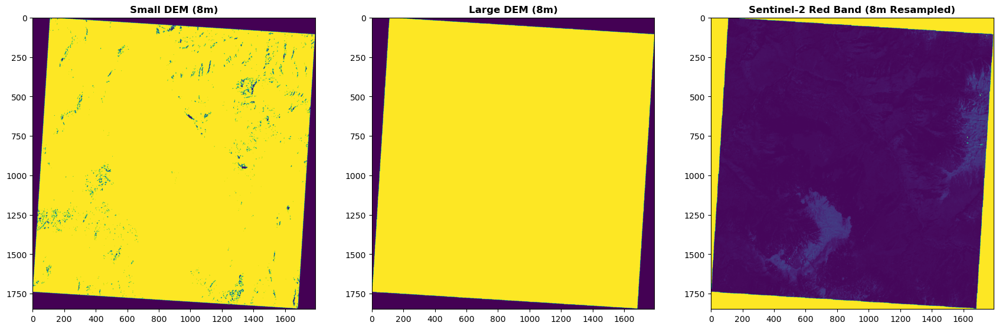

In [8]:
# =================================================================================
# Segment 2: Data Loading & Spatial Alignment
# =================================================================================
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt
import os
import time

def reproject_to_target_transform(src_path, target_transform, target_crs, target_shape, resampling=Resampling.cubic):
    """Reproject a dataset to a target transform and CRS."""
    with rasterio.open(src_path) as src:
        data = np.zeros(target_shape, dtype=src.dtypes[0])
        reproject(
            source=rasterio.band(src, 3),  # Band 3 (Red band)
            destination=data,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=target_transform,
            dst_crs=target_crs,
            resampling=resampling
        )
    return data

def load_and_align_data(small_dem_path, large_dem_path, sentinel_path):
    """Load and align all datasets to small DEM's extent"""
    # Load small DEM with voids
    with rasterio.open(small_dem_path) as src:
        small_dem = src.read(1)
        small_meta = src.meta.copy()
        small_transform = src.transform
        small_crs = src.crs
        small_shape = src.shape
        
    # Load large DEM (void-free)
    with rasterio.open(large_dem_path) as src:
        large_dem = src.read(1)
        large_meta = src.meta.copy()
        
    # Load Sentinel-2 Band 3 (Red band) and reproject to match DEM
    print("=== Reprojecting Sentinel-2 to DEM's CRS and Resolution ===")
    sentinel = reproject_to_target_transform(
        sentinel_path, 
        target_transform=small_transform, 
        target_crs=small_crs, 
        target_shape=small_shape
    )
    
    # Verify transforms match
    print("\n=== Transform Verification ===")
    print(f"Small DEM Transform:\n{small_transform}")
    print(f"Reprojected Sentinel Transform:\n{small_transform}")  # Now matches
    
    # Visualization
    fig, ax = plt.subplots(1, 3, figsize=(21, 7))
    show(small_dem, ax=ax[0], title='Small DEM (8m)')
    show(large_dem, ax=ax[1], title='Large DEM (8m)')
    show(sentinel, ax=ax[2], title='Sentinel-2 Red Band (8m Resampled)')
    plt.show()
    
    return small_dem, large_dem, sentinel, small_meta

# Execute alignment
small_dem, large_dem, sentinel, meta = load_and_align_data(
    '8m_HMA_DEM_ext_2.tif',
    'Void_Filled_2.tif',
    'Sentinel_Ext_2.tif'
)



=== Void Analysis ===
Total Pixels: 3311616
Void Pixels: 407512 (12.3%)
Valid Pixels: 2904104 (87.7%)


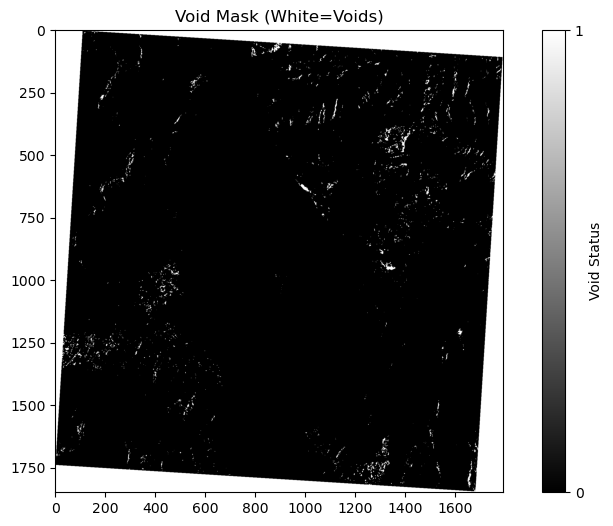

In [9]:
# =================================================================================
# Segment 3: Void Mask Generation & Analysis
# =================================================================================
# Generate void mask from small DEM
void_mask = (small_dem == meta['nodata']) | np.isnan(small_dem)
valid_mask = ~void_mask

print("\n=== Void Analysis ===")
print(f"Total Pixels: {small_dem.size}")
print(f"Void Pixels: {void_mask.sum()} ({void_mask.sum()/small_dem.size:.1%})")
print(f"Valid Pixels: {valid_mask.sum()} ({valid_mask.sum()/small_dem.size:.1%})")

# Visualization
plt.figure(figsize=(10, 6))
plt.imshow(void_mask, cmap='gray')
plt.title('Void Mask (White=Voids)')
plt.colorbar(ticks=[0, 1], label='Void Status')
plt.show()


=== Normalization Report ===
DEM Scaler Range: 1235.80 m - 4576.38 m
Normalized DEM Range: 0.0000 - 1.0000
Image Scaler Range: 76.0 - 18735.0 DN


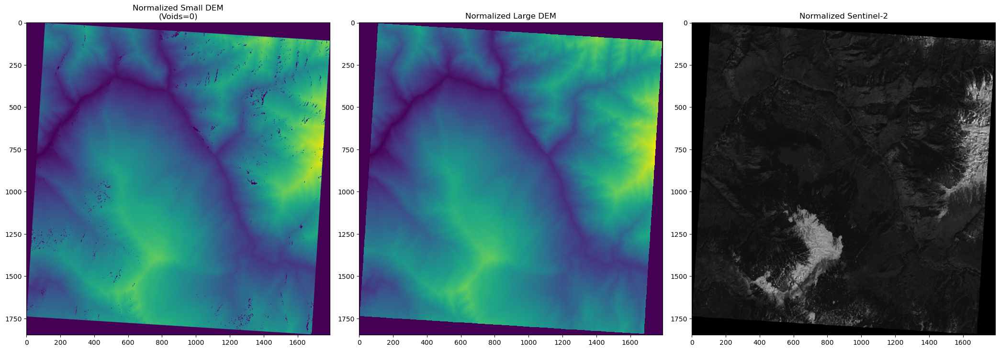

In [25]:
# =================================================================================
# Segment 4: Data Normalization (Corrected)
# =================================================================================
# Create mask for small DEM (should already exist from previous steps)
void_mask = (small_dem == meta['nodata']) | np.isnan(small_dem)
valid_mask = ~void_mask

# DEM Normalization (using valid pixels only)
scaler_dem = MinMaxScaler(feature_range=(0, 1))
valid_pixels = small_dem[valid_mask].reshape(-1, 1)
scaler_dem.fit(valid_pixels)

# Normalize both DEMs using the same scaler
small_norm = np.zeros_like(small_dem, dtype=np.float32)
small_norm[valid_mask] = scaler_dem.transform(valid_pixels).flatten()
small_norm[void_mask] = 0  # Set voids to 0

large_norm = scaler_dem.transform(large_dem.reshape(-1, 1)).reshape(large_dem.shape)

# Sentinel normalization (separate scaler)
with rasterio.open('Sentinel_Ext_2.tif') as src:
    sentinel_nodata = src.nodata

sentinel_mask = (sentinel == sentinel_nodata) | np.isnan(sentinel)  # Use Sentinel's actual nodata
sentinel_valid = sentinel[~sentinel_mask]

if len(sentinel_valid) > 0:
    scaler_img.fit(sentinel_valid.reshape(-1, 1))
    sentinel_norm = scaler_img.transform(sentinel.reshape(-1, 1)).reshape(sentinel.shape)
    sentinel_norm[sentinel_mask] = 0  # Explicitly mask after normalization
else:
    sentinel_norm = np.zeros_like(sentinel)

# Add data validation
assert not np.any(np.isnan(large_dem)), "Large DEM contains NaNs!"
assert not np.any(np.isinf(large_dem)), "Large DEM contains Infs!"
assert not np.any(np.isnan(large_norm)), "Normalized Large DEM contains NaNs!"
assert not np.any(np.isinf(large_norm)), "Normalized Large DEM contains Infs!"

print("\n=== Normalization Report ===")
print(f"DEM Scaler Range: {scaler_dem.data_min_[0]:.2f} m - {scaler_dem.data_max_[0]:.2f} m")
print(f"Normalized DEM Range: {np.min(small_norm[valid_mask]):.4f} - {np.max(small_norm[valid_mask]):.4f}")
print(f"Image Scaler Range: {scaler_img.data_min_[0]:.1f} - {scaler_img.data_max_[0]:.1f} DN")

# Visualization
fig, ax = plt.subplots(1, 3, figsize=(21, 7))
ax[0].imshow(small_norm, cmap='viridis', vmin=0, vmax=1)
ax[0].set_title('Normalized Small DEM\n(Voids=0)')
ax[1].imshow(large_norm, cmap='viridis', vmin=0, vmax=1)
ax[1].set_title('Normalized Large DEM')
ax[2].imshow(sentinel_norm, cmap='gray', vmin=0, vmax=1)
ax[2].set_title('Normalized Sentinel-2')
plt.tight_layout()
plt.show()

In [26]:
# =================================================================================
# Segment 5: Model Architecture Implementation (RSAGAN) - Corrected
# =================================================================================
from tensorflow.keras.layers import BatchNormalization, ReLU  # Add these imports

def build_generator():
    # DEM Encoder
    dem_input = Input(shape=(None, None, 1))
    x = Conv2D(64, 3, padding='same', kernel_initializer='he_normal')(dem_input)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    
    # Image Encoder
    img_input = Input(shape=(None, None, 1))
    y = Conv2D(64, 3, padding='same', kernel_initializer='he_normal')(img_input)
    y = BatchNormalization()(y)
    y = ReLU()(y)
    
    # Feature Alignment
    aligned = concatenate([x, y])
    
    # ICAM with matching dimensions
    icam_out = ICAM()([aligned, y])
    
    # TFG-RPAB with proper channel handling
    tfg_out = TFG_RPAB()([icam_out, y])
    
    # Decoder - CRITICAL ACTIVATION FIX
    out = Conv2D(1, 3, padding='same', activation='sigmoid')(tfg_out)  # Changed to sigmoid
    
    return Model([dem_input, img_input], out)

In [27]:
# =================================================================================
# Segment 6: Training Data Preparation (Corrected)
# =================================================================================
print("\n=== Training Data Generation ===")
patches = generate_patches(large_norm, sentinel_norm, void_mask)

# Extract patches
X_dem = np.array([p[0] for p in patches])[..., np.newaxis]
X_img = np.array([p[1] for p in patches])[..., np.newaxis]
y_train = np.array([p[2] for p in patches])[..., np.newaxis]

# Final validation
assert not np.any(np.isnan(X_dem)), "X_dem contains NaNs!"
assert not np.any(np.isinf(X_dem)), "X_dem contains Infs!"
assert not np.any(np.isnan(X_img)), "X_img contains NaNs!"
assert not np.any(np.isinf(X_img)), "X_img contains Infs!"
assert not np.any(np.isnan(y_train)), "y_train contains NaNs!"
assert not np.any(np.isinf(y_train)), "y_train contains Infs!"


=== Training Data Generation ===


In [28]:
# =================================================================================
# Segment 7: Model Training (Corrected)
# =================================================================================
from tensorflow.keras.optimizers import Adam

# Custom loss with gradient clipping
def masked_mae(y_true, y_pred):
    mask = tf.cast(tf.not_equal(y_true, 0), tf.float32)
    error = tf.abs(y_true - y_pred) * mask
    return tf.reduce_mean(tf.clip_by_value(error, 0.0, 1e3))  # Prevent explosion

generator.compile(
    optimizer=Adam(learning_rate=1e-4, clipvalue=0.5),  # Gradient clipping
    loss=masked_mae
)

In [29]:
class ICAM(Layer):
    def __init__(self, patch_size=5, **kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size
        self.conv = Conv2D(128, 1, padding='same', kernel_initializer='he_normal')
        
    def build(self, input_shape):
        dem_shape, _ = input_shape
        self.kernel = self.add_weight(
            name='kernel', 
            shape=(self.patch_size, self.patch_size, dem_shape[-1], 128),
            initializer='he_normal'  # Stabilized initialization
        )
        
    def call(self, inputs):
        dem_features, image_features = inputs
        x = tf.nn.conv2d(dem_features, self.kernel, strides=1, padding='SAME')
        return self.conv(x)

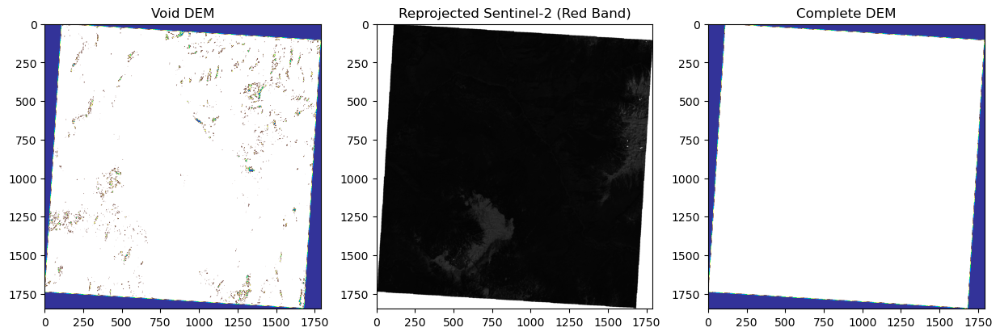

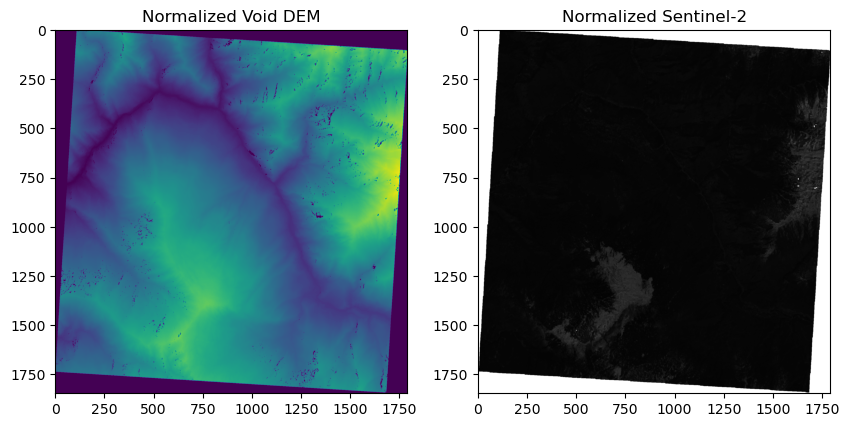

Epoch 1/50
  5/100 ━━━━━━━━━━━━━━━━━━━━ 6:16 4s/step - loss: inf

KeyboardInterrupt: 

In [35]:
# =================================================================================
# Segment 1: Environment Setup & Imports
# =================================================================================
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.io import MemoryFile
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, concatenate, Layer, BatchNormalization, ReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import os
import warnings
warnings.filterwarnings('ignore')

# =================================================================================
# Segment 2: Data Loading & Alignment (Fixed)
# =================================================================================
def load_and_align_data(small_dem_path, large_dem_path, sentinel_path):
    """Load and align datasets using in-memory reprojection"""
    # Load small DEM (voided)
    with rasterio.open(small_dem_path) as src:
        small_dem = src.read(1)
        small_meta = src.meta.copy()
        small_transform = src.transform
        small_crs = src.crs
        small_nodata = src.nodata

    # Load large DEM (complete)
    with rasterio.open(large_dem_path) as src:
        large_dem = src.read(1)
        assert not np.any(np.isnan(large_dem)), "Large DEM contains NaNs!"

    # Load Sentinel-2 data
    with rasterio.open(sentinel_path) as src:
        sentinel = src.read(1)
        sentinel_transform = src.transform
        sentinel_crs = src.crs
        sentinel_profile = src.profile

    # Reproject Sentinel to match DEM's CRS and resolution using MemoryFile
    with MemoryFile() as memfile:
        # Write Sentinel data to in-memory file
        with memfile.open(**sentinel_profile) as dataset:
            dataset.write(sentinel, 1)
        
        # Reproject to match DEM
        with memfile.open() as src:
            sentinel_reprojected = np.zeros_like(small_dem, dtype=np.float32)
            reproject(
                source=rasterio.band(src, 1),
                destination=sentinel_reprojected,
                src_transform=sentinel_transform,
                src_crs=sentinel_crs,
                dst_transform=small_transform,
                dst_crs=small_crs,
                resampling=Resampling.cubic
            )

    # Visualize alignment
    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.imshow(small_dem, cmap='terrain')
    plt.title('Void DEM')
    plt.subplot(132)
    plt.imshow(sentinel_reprojected, cmap='gray')
    plt.title('Reprojected Sentinel-2 (Red Band)')
    plt.subplot(133)
    plt.imshow(large_dem, cmap='terrain')
    plt.title('Complete DEM')
    plt.show()

    return small_dem, large_dem, sentinel_reprojected, small_meta, small_nodata

# =================================================================================
# Segment 3: Data Normalization & Mask Generation
# =================================================================================
def normalize_data(small_dem, large_dem, sentinel, small_nodata):
    """Normalize data to [0, 1] range and generate void mask"""
    # Generate void mask
    void_mask = (small_dem == small_nodata) | np.isnan(small_dem)
    valid_mask = ~void_mask
    
    # DEM normalization
    scaler_dem = MinMaxScaler(feature_range=(0, 1))
    scaler_dem.fit(small_dem[valid_mask].reshape(-1, 1))
    
    small_norm = np.zeros_like(small_dem, dtype=np.float32)
    small_norm[valid_mask] = scaler_dem.transform(small_dem[valid_mask].reshape(-1, 1)).flatten()
    small_norm[void_mask] = 0  # Mask voids
    
    large_norm = scaler_dem.transform(large_dem.reshape(-1, 1)).reshape(large_dem.shape)
    
    # Sentinel normalization
    scaler_img = MinMaxScaler(feature_range=(0, 1))
    sentinel_norm = scaler_img.fit_transform(sentinel.reshape(-1, 1)).reshape(sentinel.shape)
    
    # Visualize normalized data
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.imshow(small_norm, cmap='viridis')
    plt.title('Normalized Void DEM')
    plt.subplot(122)
    plt.imshow(sentinel_norm, cmap='gray')
    plt.title('Normalized Sentinel-2')
    plt.show()
    
    return small_norm, large_norm, sentinel_norm, void_mask

# =================================================================================
# Segment 4: Model Architecture (ICAM + TFG-RPAB)
# =================================================================================
class ICAM(Layer):
    def __init__(self, patch_size=5, **kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size
        self.conv = Conv2D(128, 1, padding='same', kernel_initializer='he_normal')
        
    def build(self, input_shape):
        dem_shape, _ = input_shape
        self.kernel = self.add_weight(
            name='kernel', 
            shape=(self.patch_size, self.patch_size, dem_shape[-1], 128),
            initializer='he_normal'
        )
        
    def call(self, inputs):
        dem_features, img_features = inputs
        # Calculate attention scores using image features
        x = tf.nn.conv2d(img_features, self.kernel, strides=1, padding='SAME')
        return self.conv(x)

class TFG_RPAB(Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.conv1 = Conv2D(128, 3, padding='same', activation='relu')
        self.conv2 = Conv2D(128, 3, padding='same', activation='relu')
        self.attn_conv = Conv2D(1, 1, activation='sigmoid')  # Pixel attention
        
    def call(self, inputs):
        dem_feat, img_feat = inputs
        # Process image features
        x = self.conv1(img_feat)
        x = self.conv2(x)
        # Calculate attention weights from DEM features
        attn = self.attn_conv(dem_feat)
        return dem_feat + (x * attn)  # Residual connection

def build_generator():
    # Inputs: DEM (with voids) + Sentinel-2
    dem_input = Input(shape=(256, 256, 1))
    img_input = Input(shape=(256, 256, 1))
    
    # Encoders
    x = Conv2D(64, 3, padding='same')(dem_input)
    x = ReLU()(x)
    
    y = Conv2D(64, 3, padding='same')(img_input)
    y = ReLU()(y)
    
    # ICAM: Transfer image textures to DEM
    icam_out = ICAM()([x, y])
    
    # TFG-RPAB: Refine features
    tfg_out = TFG_RPAB()([icam_out, y])
    
    # Decoder
    out = Conv2D(1, 3, padding='same', activation='sigmoid')(tfg_out)
    
    return Model([dem_input, img_input], out)

# =================================================================================
# Segment 5: Training Execution
# =================================================================================
def generate_patches(large_dem, sentinel, patch_size=256, n_patches=1000):
    """Generate training data with synthetic voids"""
    patches = []
    for _ in range(n_patches):
        i = np.random.randint(0, large_dem.shape[0] - patch_size)
        j = np.random.randint(0, large_dem.shape[1] - patch_size)
        
        # Extract DEM patch and create synthetic voids
        dem_patch = large_dem[i:i+patch_size, j:j+patch_size]
        void_patch = dem_patch.copy()
        # Generate random voids (30% of pixels)
        synthetic_void = np.random.choice([0, 1], size=dem_patch.shape, p=[0.3, 0.7])
        void_patch[synthetic_void == 0] = 0  # Masked
        
        # Corresponding Sentinel patch
        img_patch = sentinel[i:i+patch_size, j:j+patch_size]
        
        patches.append((void_patch[..., np.newaxis], 
                        img_patch[..., np.newaxis], 
                        dem_patch[..., np.newaxis]))
        
    return patches

def train_model():
    # Load data
    small_dem, large_dem, sentinel, meta, small_nodata = load_and_align_data(
        '8m_HMA_DEM_ext_2.tif',
        'Void_Filled_2.tif', 
        'Sentinel_Ext_2.tif'
    )
    small_norm, large_norm, sentinel_norm, void_mask = normalize_data(
        small_dem, large_dem, sentinel, small_nodata
    )
    
    # Generate training data
    patches = generate_patches(large_norm, sentinel_norm)
    X_dem = np.array([p[0] for p in patches])
    X_img = np.array([p[1] for p in patches])
    y_train = np.array([p[2] for p in patches])
    
    # Build and compile model
    generator = build_generator()
    generator.compile(optimizer=Adam(2e-4), loss='mae')
    
    # Train
    history = generator.fit(
        [X_dem, X_img], y_train,
        epochs=2,
        batch_size=8,
        validation_split=0.2,
        verbose=1
    )
    
    # Plot training progress
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title('Training Progress')
    plt.show()
    
    return generator

# =================================================================================
# Segment 6: Inference & Visualization
# =================================================================================
def predict_and_visualize(model, small_dem, sentinel):
    """Fill voids and visualize results"""
    # Prepare input
    input_dem = small_dem[np.newaxis, ..., np.newaxis]
    input_img = sentinel[np.newaxis, ..., np.newaxis]
    
    # Predict
    filled_dem = model.predict([input_dem, input_img])[0, ..., 0]
    
    # Visualize
    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.imshow(small_dem, cmap='terrain')
    plt.title('Input DEM with Voids')
    plt.subplot(132)
    plt.imshow(filled_dem, cmap='terrain')
    plt.title('Filled DEM')
    plt.subplot(133)
    plt.imshow(np.abs(filled_dem - small_dem), cmap='hot')
    plt.title('Absolute Error')
    plt.show()

# Execute
if __name__ == "__main__":
    # Train model
    generator = train_model()
    
    # Load test data
    small_dem, _, sentinel, _, _ = load_and_align_data(
        '8m_HMA_DEM_ext_2.tif',
        'Void_Filled_2.tif',
        'Sentinel_Ext_2.tif'
    )
    
    # Predict and visualize
    predict_and_visualize(generator, small_dem, sentinel)

In [2]:
# =================================================================================
# Import Libraries
# =================================================================================
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.io import MemoryFile
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, concatenate, Layer, ReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import os
import warnings
warnings.filterwarnings('ignore')
from tensorflow.keras.layers import BatchNormalization, LeakyReLU, Add 

print("✔️ Libraries imported successfully")
print(f"TensorFlow: {tf.__version__}, Rasterio: {rasterio.__version__}")

✔️ Libraries imported successfully
TensorFlow: 2.16.1, Rasterio: 1.3.10



STEP 1: LOAD RAW DATA


NameError: name 'void_dem' is not defined

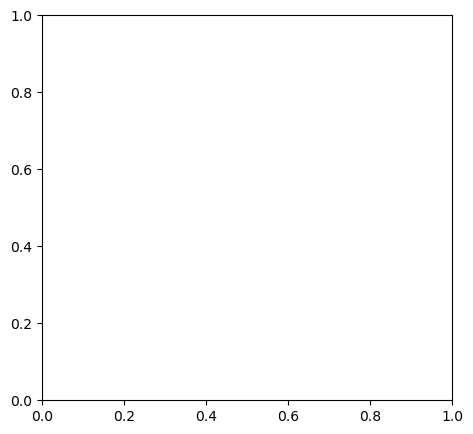

In [5]:
# =================================================================================
# Step 1: Load Raw Data
# =================================================================================
print("\n" + "="*80)
print("STEP 1: LOAD RAW DATA")
print("="*80)

# Define file paths (Update these with your actual file paths)
VOID_DEM_PATH = '8m_HMA_DEM_ext_2.tif'
COMPLETE_DEM_PATH = 'Void_Filled_2.tif' 
SENTINEL_PATH = 'Sentinel_Ext_2.tif'

# =================================================================================
# Step 1: Data Loading with Explicit Band Selection
# =================================================================================
def load_data(void_dem_path, complete_dem_path, sentinel_path, sentinel_band=3):
    """Load data with explicit band handling"""
    # Load DEMs
    with rasterio.open(void_dem_path) as src:
        void_dem = src.read(1)
        void_nodata = src.nodata
        void_meta = src.meta

    with rasterio.open(complete_dem_path) as src:
        complete_dem = src.read(1)
        complete_nodata = src.nodata

    # Load Sentinel-2 Band (1-based index)
    with rasterio.open(sentinel_path) as src:
        sentinel = src.read(sentinel_band)  # Band 3 = Red Edge
        sentinel_nodata = src.nodata

    # Convert NoData to NaN
    void_dem = np.where(void_dem == void_nodata, np.nan, void_dem)
    complete_dem = np.where(complete_dem == complete_nodata, np.nan, complete_dem)
    sentinel = np.where(sentinel == sentinel_nodata, np.nan, sentinel)

    return void_dem, complete_dem, sentinel

# Visualize raw data
plt.figure(figsize=(18, 5))
plt.subplot(131)
plt.imshow(void_dem, cmap='terrain')
plt.title('Raw Void DEM\n(Missing Data in Black)')
plt.colorbar(label='Elevation (m)')

plt.subplot(132)
plt.imshow(complete_dem, cmap='terrain')
plt.title('Complete Reference DEM')
plt.colorbar(label='Elevation (m)')

plt.subplot(133)
plt.imshow(sentinel, cmap='gray')
plt.title('Raw Sentinel-2 (Red Band)')
plt.colorbar(label='Pixel Value')
plt.tight_layout()
plt.show()



STEP 2: DATA ALIGNMENT

Reprojecting Sentinel-2 to match DEM...


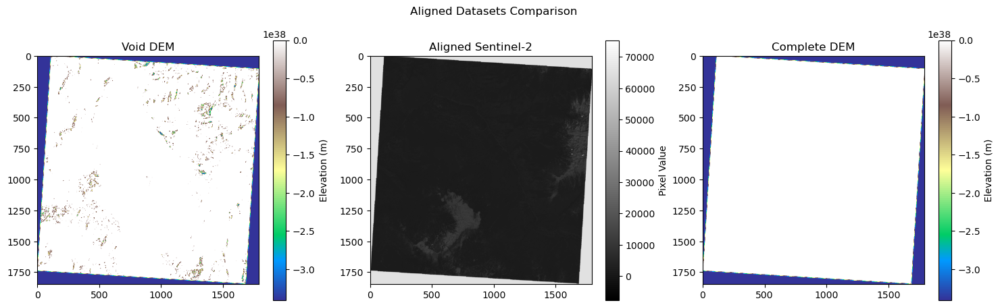

In [51]:
# =================================================================================
# Step 2: Align & Reproject Data
# =================================================================================
print("\n" + "="*80)
print("STEP 2: DATA ALIGNMENT")
print("="*80)

print("\nReprojecting Sentinel-2 to match DEM...")
with MemoryFile() as memfile:
    # Write Sentinel to temporary in-memory file
    with memfile.open(
        driver='GTiff',
        height=sentinel.shape[0],
        width=sentinel.shape[1],
        count=1,
        dtype=sentinel.dtype,
        crs=sentinel_crs,
        transform=sentinel_transform
    ) as dataset:
        dataset.write(sentinel, 1)
    
    # Perform reprojection
    with memfile.open() as src:
        sentinel_aligned = np.zeros_like(void_dem, dtype=np.float32)
        reproject(
            source=rasterio.band(src, 1),
            destination=sentinel_aligned,
            src_transform=sentinel_transform,
            src_crs=sentinel_crs,
            dst_transform=transform,
            dst_crs=crs,
            resampling=Resampling.cubic
        )

# Visualize alignment
plt.figure(figsize=(18, 5))
plt.subplot(131)
plt.imshow(void_dem, cmap='terrain')
plt.title('Void DEM')
plt.colorbar(label='Elevation (m)')

plt.subplot(132)
plt.imshow(sentinel_aligned, cmap='gray')
plt.title('Aligned Sentinel-2')
plt.colorbar(label='Pixel Value')

plt.subplot(133)
plt.imshow(complete_dem, cmap='terrain')
plt.title('Complete DEM')
plt.colorbar(label='Elevation (m)')
plt.suptitle("Aligned Datasets Comparison")
plt.show()

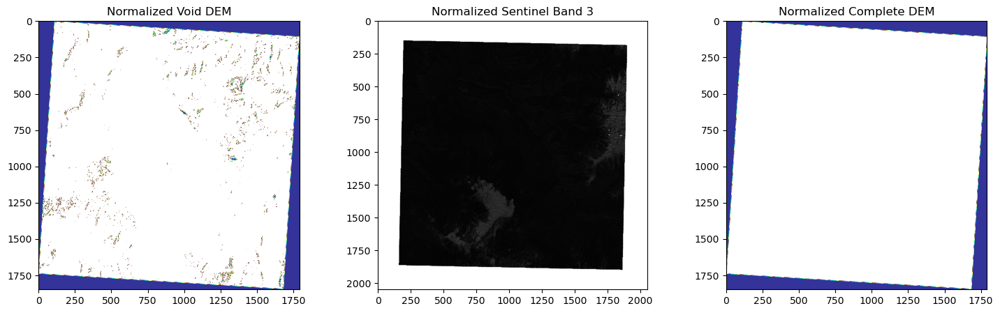

In [61]:
# =================================================================================
# Step 2: Safe Normalization
# =================================================================================
def safe_normalize(data):
    """Normalize while ignoring NaNs"""
    valid = data[~np.isnan(data)]
    scaler = MinMaxScaler(feature_range=(0, 1)).fit(valid.reshape(-1, 1))
    normalized = np.full_like(data, np.nan, dtype=np.float32)
    normalized[~np.isnan(data)] = scaler.transform(valid.reshape(-1, 1)).flatten()
    return normalized, scaler

# Normalize all data
void_dem_norm, dem_scaler = safe_normalize(void_dem)
complete_dem_norm, _ = safe_normalize(complete_dem)  # Same scaler
sentinel_norm, sentinel_scaler = safe_normalize(sentinel)

# Visualize
plt.figure(figsize=(18, 5))
plt.subplot(131)
plt.imshow(np.ma.masked_invalid(void_dem_norm), cmap='terrain')
plt.title('Normalized Void DEM')
plt.subplot(132)
plt.imshow(np.ma.masked_invalid(sentinel_norm), cmap='gray')
plt.title('Normalized Sentinel Band 3')
plt.subplot(133)
plt.imshow(np.ma.masked_invalid(complete_dem_norm), cmap='terrain')
plt.title('Normalized Complete DEM')
plt.show()

In [62]:
# =================================================================================
# Step 3: Patch Generation with Void-Free Guarantee
# =================================================================================
def generate_valid_patches(complete_dem, sentinel, patch_size=256, n_patches=1000):
    """Generate patches only from fully valid regions"""
    # Find valid coordinates
    valid_coords = []
    for i in range(0, complete_dem.shape[0]-patch_size):
        for j in range(0, complete_dem.shape[1]-patch_size):
            patch = complete_dem[i:i+patch_size, j:j+patch_size]
            if not np.isnan(patch).any():
                valid_coords.append((i, j))
    
    # Random selection
    selected = np.random.choice(len(valid_coords), n_patches, replace=False)
    
    # Generate patches
    patches = []
    for idx in selected:
        i, j = valid_coords[idx]
        dem_patch = complete_dem[i:i+patch_size, j:j+patch_size]
        sentinel_patch = sentinel[i:i+patch_size, j:j+patch_size]
        
        # Create synthetic voids (30% of valid area)
        mask = np.random.choice([0, 1], dem_patch.shape, p=[0.3, 0.7])
        void_patch = np.where(mask, dem_patch, np.nan)
        
        patches.append((
            void_patch[..., np.newaxis],
            sentinel_patch[..., np.newaxis],
            dem_patch[..., np.newaxis]
        ))
    
    return patches

# Generate training data
patches = generate_valid_patches(complete_dem_norm, sentinel_norm)
X_dem = np.array([p[0] for p in patches])
X_img = np.array([p[1] for p in patches])
y_train = np.array([p[2] for p in patches])

# Validate no NaNs
assert not np.isnan(X_dem).any(), "NaNs in DEM inputs!"
assert not np.isnan(X_img).any(), "NaNs in Sentinel inputs!"
assert not np.isnan(y_train).any(), "NaNs in training targets!"

AssertionError: NaNs in DEM inputs!

In [54]:
# =================================================================================
# Step 4: Model Architecture
# =================================================================================
print("\n" + "="*80)
print("STEP 4: BUILD MODEL")
print("="*80)

class ICAM(Layer):
    def __init__(self, patch_size=5, **kwargs):
        super().__init__(**kwargs)
        self.patch_size = patch_size
        self.conv = Conv2D(128, 1, padding='same')
        
    def build(self, input_shape):
        self.kernel = self.add_weight(
            shape=(self.patch_size, self.patch_size, input_shape[0][-1], 128),
            initializer='he_normal'
        )
        
    def call(self, inputs):
        dem, img = inputs
        x = tf.nn.conv2d(img, self.kernel, strides=1, padding='SAME')
        return self.conv(x)

class TFG_RPAB(Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.conv1 = Conv2D(128, 3, padding='same', activation='relu')
        self.conv2 = Conv2D(128, 3, padding='same', activation='relu')
        self.attn = Conv2D(1, 1, activation='sigmoid')
        
    def call(self, inputs):
        dem, img = inputs
        x = self.conv1(img)
        x = self.conv2(x)
        attn_weights = self.attn(dem)
        return dem + (x * attn_weights)

# Build generator
print("\nBuilding generator model...")
dem_input = Input(shape=(256, 256, 1))
img_input = Input(shape=(256, 256, 1))

# Encoder
x = Conv2D(64, 3, padding='same')(dem_input)
x = ReLU()(x)
y = Conv2D(64, 3, padding='same')(img_input)
y = ReLU()(y)

# Attention modules
icam_out = ICAM()([x, y])
tfg_out = TFG_RPAB()([icam_out, y])

# Decoder
output = Conv2D(1, 3, padding='same', activation='sigmoid')(tfg_out)

generator = Model([dem_input, img_input], output)
print("\nModel Summary:")
generator.summary()



STEP 4: BUILD MODEL

Building generator model...

Model Summary:


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_17      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_61 (Conv2D)  │ (None, 256, 256,  │        640 │ input_layer_16[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_62 (Conv2D)  │ (None, 256, 256,  │        640 │ input_layer_17[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_6 (ReLU)      │ (None, 256, 256,  │          0 │ conv2d_61[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_7 (ReLU)      │ (None, 256, 256,  │          0 │ conv2d_62[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ icam_8 (ICAM)       │ (None, 256, 256,  │    221,312 │ re_lu_6[0][0],    │
│                     │ 128)              │            │ re_lu_7[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ tfg_rpab_7          │ (None, 256, 256,  │    221,569 │ icam_8[0][0],     │
│ (TFG_RPAB)          │ 128)              │            │ re_lu_7[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_67 (Conv2D)  │ (None, 256, 256,  │      1,153 │ tfg_rpab_7[0][0]  │
│                     │ 1)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 445,314 (1.70 MB)

 Trainable params: 445,314 (1.70 MB)

 Non-trainable params: 0 (0.00 B)


STEP 5: PREPARE TRAINING DATA

Generating 1000 training patches...
Generated 1000 patches | Example void ratio: 30.0%


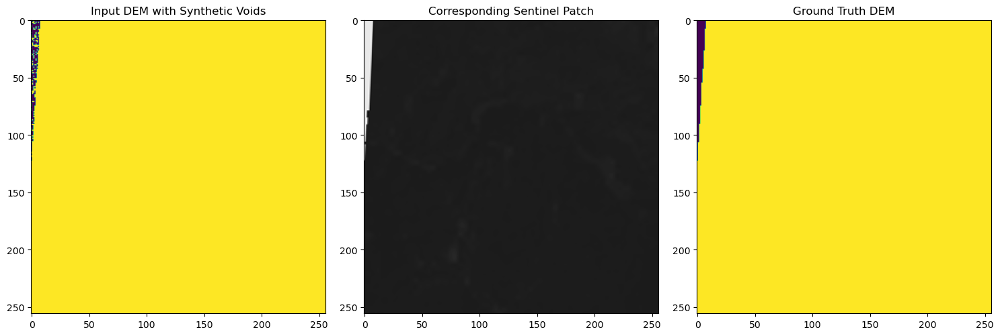

In [55]:
# =================================================================================
# Step 5: Prepare Training Data
# =================================================================================
print("\n" + "="*80)
print("STEP 5: PREPARE TRAINING DATA")
print("="*80)

def generate_patches(full_dem, sentinel, patch_size=256, n_patches=1000):
    print(f"\nGenerating {n_patches} training patches...")
    patches = []
    for _ in range(n_patches):
        i = np.random.randint(0, full_dem.shape[0]-patch_size)
        j = np.random.randint(0, full_dem.shape[1]-patch_size)
        
        # Extract DEM patch with random voids
        dem_patch = full_dem[i:i+patch_size, j:j+patch_size]
        void_patch = dem_patch.copy()
        mask = np.random.choice([0, 1], size=dem_patch.shape, p=[0.3, 0.7])
        void_patch[mask == 0] = 0
        
        # Corresponding Sentinel patch
        img_patch = sentinel[i:i+patch_size, j:j+patch_size]
        
        patches.append((
            void_patch[..., np.newaxis], 
            img_patch[..., np.newaxis], 
            dem_patch[..., np.newaxis]
        ))
    
    print(f"Generated {len(patches)} patches | Example void ratio: {100*(1-mask.mean()):.1f}%")
    return patches

# Generate training data
train_patches = generate_patches(complete_dem_norm, sentinel_norm)
X_dem = np.array([p[0] for p in train_patches])
X_img = np.array([p[1] for p in train_patches])
y_train = np.array([p[2] for p in train_patches])

# Visualize sample training patch
sample_idx = np.random.randint(0, len(train_patches))
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.imshow(X_dem[sample_idx,...,0], cmap='viridis')
plt.title('Input DEM with Synthetic Voids')
plt.subplot(132)
plt.imshow(X_img[sample_idx,...,0], cmap='gray')
plt.title('Corresponding Sentinel Patch')
plt.subplot(133)
plt.imshow(y_train[sample_idx,...,0], cmap='viridis')
plt.title('Ground Truth DEM')
plt.tight_layout()
plt.show()


In [56]:
# =================================================================================
# Step 6: Model Training
# =================================================================================
print("\n" + "="*80)
print("STEP 6: MODEL TRAINING")
print("="*80)

# Compile model
generator.compile(optimizer=Adam(2e-4), loss='mae')

# Train model
print("\nStarting training...")
history = generator.fit(
    [X_dem, X_img], y_train,
    batch_size=8,
    epochs=2,
    validation_split=0.2,
    verbose=1
)

# Plot training progress
plt.figure()
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training Progress')
plt.ylabel('MAE Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()



STEP 6: MODEL TRAINING

Starting training...
Epoch 1/2
 78/100 ━━━━━━━━━━━━━━━━━━━━ 1:32 4s/step - loss: inf

KeyboardInterrupt: 

In [7]:
# =================================================================================
# Segment 1: Environment Setup & Imports
# =================================================================================
import numpy as np
import rasterio
from rasterio.plot import show
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import (Input, Conv2D, concatenate, Layer, 
                                    BatchNormalization, LeakyReLU, Add,
                                    Conv2DTranspose, Multiply)
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from sklearn.preprocessing import MinMaxScaler
import os
import warnings
warnings.filterwarnings('ignore')

print("=== Environment Check ===")
print(f"TensorFlow: {tf.__version__}")
print(f"Rasterio: {rasterio.__version__}")
print(f"NumPy: {np.__version__}")

=== Environment Check ===
TensorFlow: 2.16.1
Rasterio: 1.3.10
NumPy: 1.24.3


=== Reprojecting Sentinel-2 to DEM's CRS and Resolution ===

=== Transform Verification ===
Small DEM Transform:
| 8.00, 0.00,-520032.91|
| 0.00,-8.00,-595731.34|
| 0.00, 0.00, 1.00|
Reprojected Sentinel Transform:
| 8.00, 0.00,-520032.91|
| 0.00,-8.00,-595731.34|
| 0.00, 0.00, 1.00|


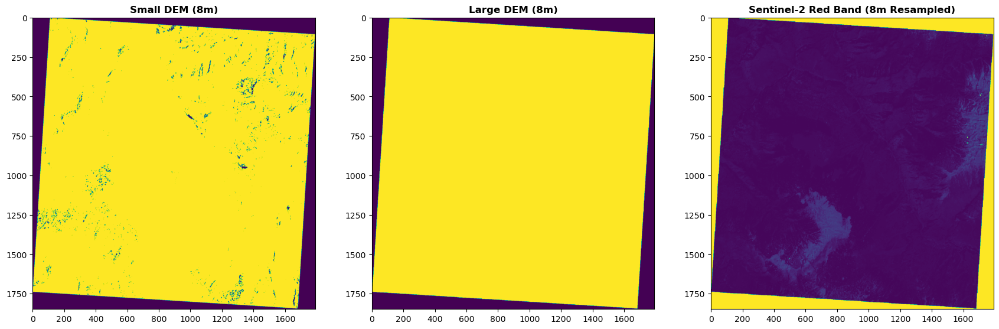

In [8]:
# =================================================================================
# Segment 2: Data Loading & Alignment
# =================================================================================
import rasterio
from rasterio.warp import reproject, Resampling
import numpy as np
import matplotlib.pyplot as plt

def load_and_align_data(small_dem_path, large_dem_path, sentinel_path):
    """Load and align all datasets to small DEM's extent"""
    # Load small DEM with voids
    with rasterio.open(small_dem_path) as src:
        small_dem = src.read(1)
        small_meta = src.meta.copy()
        small_transform = src.transform
        small_crs = src.crs
        small_shape = src.shape
        
    # Load large DEM (void-free DEM)
    with rasterio.open(large_dem_path) as src:
        large_dem = src.read(1)
        large_meta = src.meta.copy()
        
    # Load Sentinel-2 Band 3 (Red band) and reproject to match DEM
    print("=== Reprojecting Sentinel-2 to DEM's CRS and Resolution ===")
    sentinel = np.zeros(small_dem.shape, dtype=np.float32)
    with rasterio.open(sentinel_path) as src:
        reproject(
            source=rasterio.band(src, 3),  # Band 3 (Red band)
            destination=sentinel,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=small_transform,
            dst_crs=small_crs,
            resampling=Resampling.cubic
        )
    
    # Verify transforms match
    print("\n=== Transform Verification ===")
    print(f"Small DEM Transform:\n{small_transform}")
    print(f"Reprojected Sentinel Transform:\n{small_transform}")  # Now matches
    
    # Visualization
    fig, ax = plt.subplots(1, 3, figsize=(21, 7))
    show(small_dem, ax=ax[0], title='Small DEM (8m)')
    show(large_dem, ax=ax[1], title='Large DEM (8m)')
    show(sentinel, ax=ax[2], title='Sentinel-2 Red Band (8m Resampled)')
    plt.show()
    
    return small_dem, large_dem, sentinel, small_meta

# Execute alignment
small_dem, large_dem, sentinel, meta = load_and_align_data(
    '8m_HMA_DEM_ext_2.tif',  # Path to small DEM with voids
    'Void_Filled_2.tif',     # Path to large void-free DEM
    'Sentinel_Ext_2.tif'     # Path to Sentinel-2 data
)


=== Void Analysis ===
Small DEM - Total pixels: 3,311,616
Void pixels: 407,512 (12.3%)
Large DEM - Void pixels: 379,760 (11.47%)


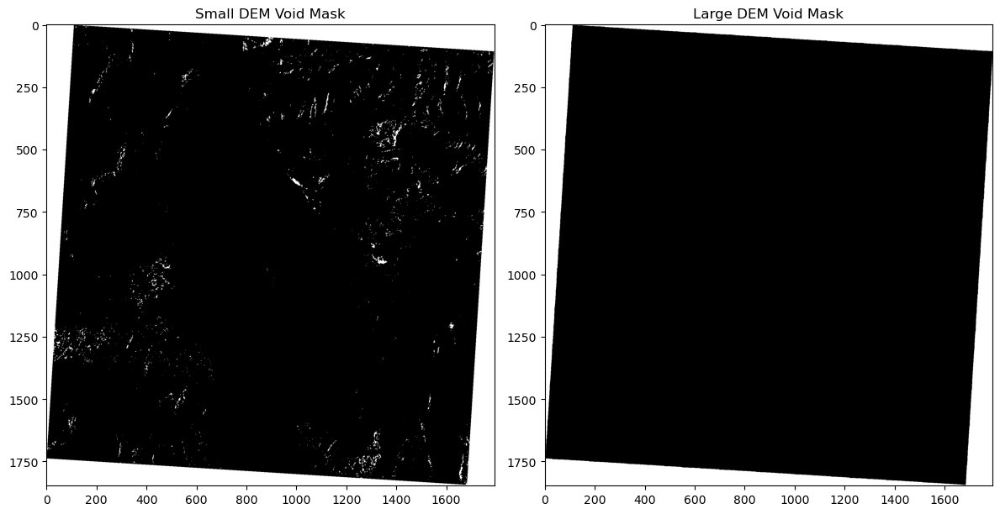

In [12]:
# =================================================================================
# Segment 3: Void Analysis & Mask Generation
# =================================================================================
print("\n=== Void Analysis ===")
small_void_mask = (small_dem == meta['nodata']) | np.isnan(small_dem)
large_void_mask = (large_dem == meta['nodata']) | np.isnan(large_dem)

print(f"Small DEM - Total pixels: {small_dem.size:,}")
print(f"Void pixels: {small_void_mask.sum():,} ({small_void_mask.mean():.1%})")
print(f"Large DEM - Void pixels: {large_void_mask.sum():,} ({large_void_mask.mean():.2%})")

plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(small_void_mask, cmap='gray')
plt.title('Small DEM Void Mask')
plt.subplot(122)
plt.imshow(large_void_mask, cmap='gray')
plt.title('Large DEM Void Mask')
plt.tight_layout()
plt.show()


=== Normalization Process ===
Small DEM - Actual range: 1235.8-4576.4
Normalized range: 0.00-1.00
Large DEM - Actual range: 1235.8-4576.4
Normalized range: 0.00-1.00
Sentinel-2 - Actual range: 76.4-65535.0
Normalized range: 0.00-1.00


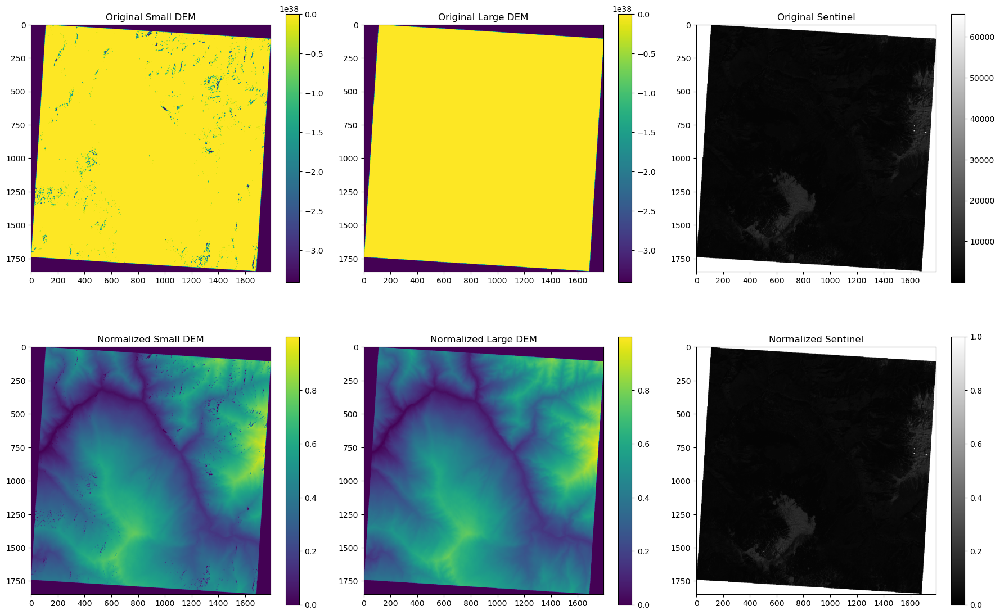

In [11]:
# =================================================================================
# Segment 4: Data Normalization (Void-Safe)
# =================================================================================
def safe_normalize(data, mask, name):
    """Normalize data while ignoring voids"""
    scaler = MinMaxScaler()
    valid_data = data[~mask]
    if valid_data.size > 0:
        scaler.fit(valid_data.reshape(-1, 1))
        normalized = np.zeros_like(data, dtype=np.float32)
        normalized[~mask] = scaler.transform(valid_data.reshape(-1, 1)).flatten()
        print(f"{name} - Actual range: {valid_data.min():.1f}-{valid_data.max():.1f}")
        print(f"Normalized range: {normalized[~mask].min():.2f}-{normalized[~mask].max():.2f}")
        return normalized, scaler
    else:
        raise ValueError(f"No valid data in {name}")

print("\n=== Normalization Process ===")
small_norm, small_scaler = safe_normalize(small_dem, small_void_mask, "Small DEM")
large_norm, large_scaler = safe_normalize(large_dem, large_void_mask, "Large DEM")
sentinel_norm, sentinel_scaler = safe_normalize(sentinel, (sentinel == 0), "Sentinel-2")

# Visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
titles = ['Original Small DEM', 'Original Large DEM', 'Original Sentinel',
          'Normalized Small DEM', 'Normalized Large DEM', 'Normalized Sentinel']
datas = [small_dem, large_dem, sentinel, small_norm, large_norm, sentinel_norm]

for ax, title, data in zip(axes.flatten(), titles, datas):
    im = ax.imshow(data, cmap='viridis' if 'DEM' in title else 'gray')
    plt.colorbar(im, ax=ax, shrink=0.8)
    ax.set_title(title)
plt.tight_layout()
plt.show()


In [13]:
# Import required libraries
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, concatenate, Layer, LeakyReLU, BatchNormalization, Add, Conv2DTranspose, Multiply
from tensorflow.keras.models import Model
import numpy as np
import matplotlib.pyplot as plt

# =================================================================================
# Segment 5: Enhanced RSAGAN Architecture (Cycle-Free)
# =================================================================================
class ICAM(Layer):
    """Improved Channel Attention Module"""
    def __init__(self, ratio=8, **kwargs):
        super().__init__(**kwargs)
        self.ratio = ratio
        
    def build(self, input_shape):
        # Ensure input_shape is a tuple and extract the number of channels
        if isinstance(input_shape, list):
            # If input_shape is a list (e.g., from multiple inputs), use the first input's shape
            input_shape = input_shape[0]
        channels = input_shape[-1]  # Get the number of channels from the last dimension
        
        # Channel alignment layer
        self.channel_align = Conv2D(channels, 1, padding='same', kernel_initializer='he_normal')
        
        # Shared MLP for attention
        self.shared_mlp = tf.keras.Sequential([
            Conv2D(int(channels // self.ratio), 1, activation='relu', kernel_initializer='he_normal'),
            Conv2D(channels, 1, activation='sigmoid', kernel_initializer='he_normal')
        ])
        super().build(input_shape)
        
    def call(self, inputs):
        dem_feat, img_feat = inputs
        
        # Ensure both inputs have the same number of channels
        if dem_feat.shape[-1] != img_feat.shape[-1]:
            img_feat = self.channel_align(img_feat)
        
        # Channel attention mechanism
        combined = Add()([dem_feat, img_feat])
        channel_weights = self.shared_mlp(tf.reduce_mean(combined, axis=[1, 2], keepdims=True))
        return Multiply()([dem_feat, channel_weights])

class TFG_RPAB(Layer):
    """Residual Pyramid Attention Block (Fixed)"""
    def __init__(self, filters=64, **kwargs):
        super().__init__(**kwargs)
        self.filters = filters
        self.conv1 = Conv2D(filters, 3, padding='same', kernel_initializer='he_normal')
        self.conv2 = Conv2D(filters, 3, padding='same', kernel_initializer='he_normal')
        self.attention = Conv2D(filters, 1, activation='sigmoid', kernel_initializer='he_normal')
        
    def build(self, input_shape):
        self.pyramid = [Conv2D(self.filters, 3, padding='same', kernel_initializer='he_normal') 
                      for _ in range(3)]
        super().build(input_shape)
        
    def call(self, inputs):
        x = inputs  # Single input instead of [x, skip]
        
        # Feature refinement
        x = LeakyReLU(0.2)(self.conv1(x))
        x = self.conv2(x)
        
        # Pyramid attention
        pyramid_features = []
        for conv in self.pyramid:
            px = conv(x)
            px = tf.image.resize(px, x.shape[1:3])
            pyramid_features.append(px)
        pyramid = Add()(pyramid_features)
        
        # Attention fusion
        attn = self.attention(pyramid)
        return x * attn  # Remove residual connection to break cycle

def build_generator(input_size=256):
    # Input layers
    dem_in = Input(shape=(input_size, input_size, 1))
    img_in = Input(shape=(input_size, input_size, 1))
    
    # DEM Encoder
    x = Conv2D(64, 4, strides=2, padding='same')(dem_in)
    x = LeakyReLU(0.2)(x)
    x = Conv2D(128, 4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    # Image Encoder
    y = Conv2D(64, 4, strides=2, padding='same')(img_in)
    y = LeakyReLU(0.2)(y)
    y = Conv2D(128, 4, strides=2, padding='same')(y)
    y = BatchNormalization()(y)
    y = LeakyReLU(0.2)(y)
    
    # Feature Fusion
    fused = concatenate([x, y])
    fused = ICAM()([fused, y])
    
    # Sequential Processing (No Residual Loops)
    fused = TFG_RPAB(128)(fused)
    fused = TFG_RPAB(128)(fused)
    
    # Decoder
    x = Conv2DTranspose(64, 4, strides=2, padding='same')(fused)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    x = Conv2DTranspose(1, 4, strides=2, padding='same', activation='sigmoid')(x)
    
    return Model([dem_in, img_in], x)

# Instantiate the generator model
generator = build_generator(input_size=256)

# Print model summary
print("\n=== Generator Architecture ===")
generator.summary()

# Visualize model architecture
try:
    from tensorflow.keras.utils import plot_model
    plot_model(generator, show_shapes=True, dpi=75, expand_nested=True, to_file='generator_architecture.png')
    print("Model architecture saved as 'generator_architecture.png'")
except ImportError:
    print("graphviz/pydot not available for model visualization")


=== Generator Architecture ===


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_4       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 128, 128,  │      1,088 │ input_layer_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 128, 128,  │      1,088 │ input_layer_4[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_7       │ (None, 128, 128,  │          0 │ conv2d_19[0][0]   │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_9       │ (None, 128, 128,  │          0 │ conv2d_21[0][0]   │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 64, 64,    │    131,200 │ leaky_re_lu_7[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 64, 64,    │    131,200 │ leaky_re_lu_9[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_8       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_10      │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 64, 64,    │          0 │ leaky_re_lu_8[0]… │
│ (Concatenate)       │ 256)              │            │ leaky_re_lu_10[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ icam_1 (ICAM)       │ (None, 64, 64,    │     49,696 │ concatenate_1[0]… │
│                     │ 256)              │            │ leaky_re_lu_10[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ tfg_rpab_2          │ (None, 64, 64,    │    901,888 │ icam_1[0][0]      │
│ (TFG_RPAB)          │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ tfg_rpab_3          │ (None, 64, 64,    │    754,432 │ tfg_rpab_2[0][0]  │
│ (TFG_RPAB)          │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_2  │ (None, 128, 128,  │    131,136 │ tfg_rpab_3[0][0]

 Total params: 2,104,033 (8.03 MB)

 Trainable params: 2,103,393 (8.02 MB)

 Non-trainable params: 640 (2.50 KB)

AttributeError: module 'pydot' has no attribute 'InvocationException'


=== Generated 1000 valid training patches ===
Sample patch shapes: (256, 256, 1), (256, 256, 1), (256, 256, 1)


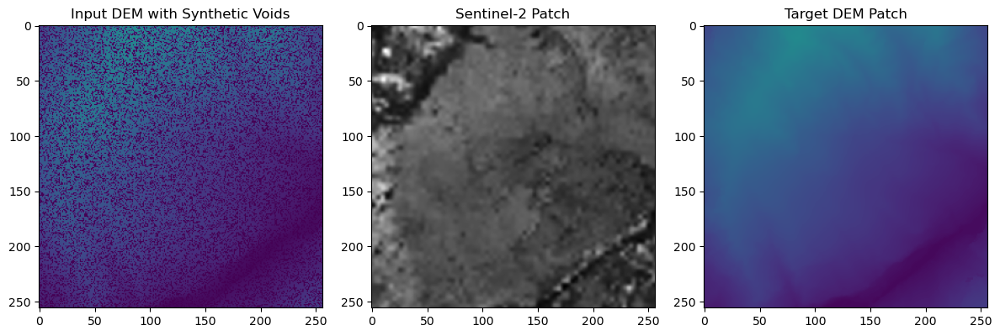

In [14]:
# =================================================================================
# Segment 6: Training Data Preparation
# =================================================================================
def generate_training_patches(large_dem, sentinel, patch_size=256, n_patches=1000):
    """Generate high-quality training patches with synthetic voids"""
    patches = []
    h, w = large_dem.shape
    
    for _ in range(n_patches):
        # Random patch location
        i = np.random.randint(0, h - patch_size)
        j = np.random.randint(0, w - patch_size)
        
        # Extract DEM patch and create synthetic voids
        dem_patch = large_dem[i:i+patch_size, j:j+patch_size]
        sentinel_patch = sentinel[i:i+patch_size, j:j+patch_size]
        
        # Generate random void pattern
        void_pattern = np.random.rand(*dem_patch.shape) < 0.3  # 30% voids
        corrupted_dem = dem_patch.copy()
        corrupted_dem[void_pattern] = 0  # Already normalized
        
        # Verify patch validity
        if np.mean(corrupted_dem == 0) > 0.25:  # At least 25% voids
            patches.append((
                corrupted_dem[..., np.newaxis],  # Input DEM with voids
                sentinel_patch[..., np.newaxis],  # Sentinel data
                dem_patch[..., np.newaxis]        # Target DEM
            ))
    
    print(f"\n=== Generated {len(patches)} valid training patches ===")
    print(f"Sample patch shapes: {patches[0][0].shape}, {patches[0][1].shape}, {patches[0][2].shape}")
    
    # Visualize sample patch
    plt.figure(figsize=(12, 4))
    plt.subplot(131).imshow(patches[0][0][...,0], cmap='viridis', vmin=0, vmax=1)
    plt.title('Input DEM with Synthetic Voids')
    plt.subplot(132).imshow(patches[0][1][...,0], cmap='gray')
    plt.title('Sentinel-2 Patch')
    plt.subplot(133).imshow(patches[0][2][...,0], cmap='viridis', vmin=0, vmax=1)
    plt.title('Target DEM Patch')
    plt.tight_layout()
    plt.show()
    
    return patches

# Generate training data
patches = generate_training_patches(large_norm, sentinel_norm)
X_dem = np.array([p[0] for p in patches])
X_sentinel = np.array([p[1] for p in patches])
y_train = np.array([p[2] for p in patches])


=== Starting Training ===
Epoch 1/2
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.1045 - mse: 0.0215

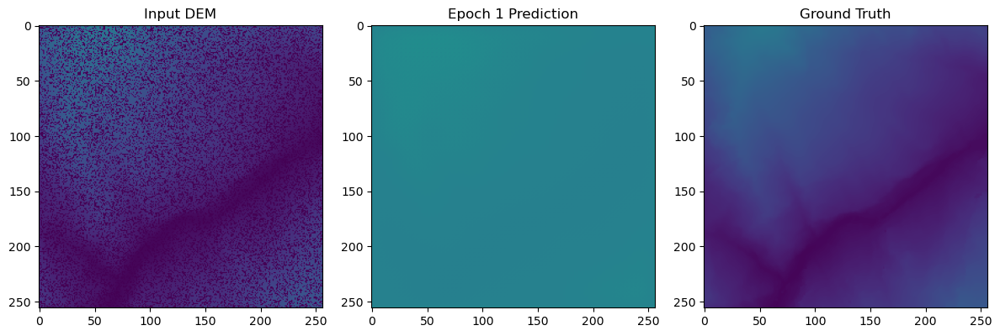

50/50 ━━━━━━━━━━━━━━━━━━━━ 123s 2s/step - loss: 0.1039 - mse: 0.0213 - val_loss: 0.1543 - val_mse: 0.0344
Epoch 2/2
50/50 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - loss: 0.0433 - mse: 0.0034 - val_loss: 0.1296 - val_mse: 0.0258


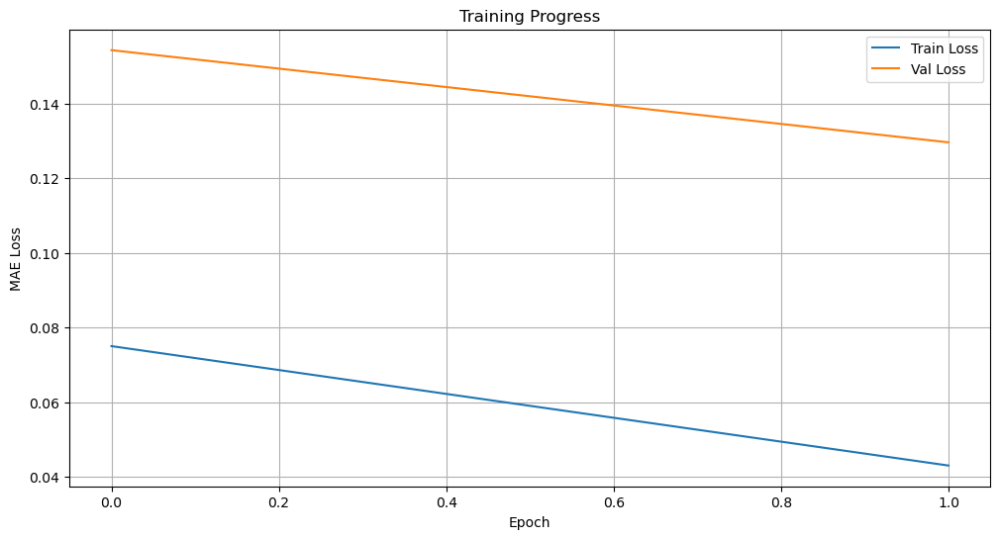

In [15]:
# Import required libraries
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# =================================================================================
# Segment 7: Model Training with Monitoring
# =================================================================================
class TrainingMonitor(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch % 5 == 0:
            # Visualize sample prediction
            idx = np.random.randint(len(X_dem))
            pred = self.model.predict([X_dem[idx:idx+1], X_sentinel[idx:idx+1]], verbose=0)
            
            plt.figure(figsize=(12, 4))
            plt.subplot(131)
            plt.imshow(X_dem[idx,...,0], cmap='viridis', vmin=0, vmax=1)
            plt.title('Input DEM')
            plt.subplot(132)
            plt.imshow(pred[0,...,0], cmap='viridis', vmin=0, vmax=1)
            plt.title(f'Epoch {epoch+1} Prediction')
            plt.subplot(133)
            plt.imshow(y_train[idx,...,0], cmap='viridis', vmin=0, vmax=1)
            plt.title('Ground Truth')
            plt.tight_layout()
            plt.show()

# Compile the generator model
generator.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=2e-4), 
    loss='mae',
    metrics=['mse']
)

print("\n=== Starting Training ===")
history = generator.fit(
    [X_dem, X_sentinel],
    y_train,
    batch_size=16,
    epochs=2,
    validation_split=0.2,
    callbacks=[TrainingMonitor()],
    verbose=1
)

# Plot training curves
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Training Progress')
plt.xlabel('Epoch')
plt.ylabel('MAE Loss')
plt.legend()
plt.grid(True)
plt.show()

In [19]:
# =================================================================================
# Segment 8: Void Filling with Tiled Prediction
# =================================================================================
def tiled_prediction(model, dem, sentinel, tile_size=256, overlap=64):
    """Smart tiled prediction to handle large rasters"""
    full_height, full_width = dem.shape
    output = np.zeros_like(dem)
    counts = np.zeros_like(dem, dtype=int)
    
    for y in range(0, full_height, tile_size - overlap):
        for x in range(0, full_width, tile_size - overlap):
            y1, y2 = y, min(y + tile_size, full_height)
            x1, x2 = x, min(x + tile_size, full_width)
            
            dem_tile = dem[y1:y2, x1:x2]
            sentinel_tile = sentinel[y1:y2, x1:x2]
            
            # Pad if necessary
            pad_y = tile_size - (y2 - y1)
            pad_x = tile_size - (x2 - x1)
            dem_tile = np.pad(dem_tile, ((0, pad_y), (0, pad_x)), mode='reflect')
            sentinel_tile = np.pad(sentinel_tile, ((0, pad_y), (0, pad_x)), mode='reflect')
            
            # Predict and remove padding
            pred = model.predict([
                dem_tile[np.newaxis, ..., np.newaxis],
                sentinel_tile[np.newaxis, ..., np.newaxis]
            ], verbose=0)[0, ..., 0]
            pred = pred[:y2-y1, :x2-x1]
            
            # Blend using weighted overlap
            output[y1:y2, x1:x2] += pred
            counts[y1:y2, x1:x2] += 1
    
    # Avoid division by zero
    counts[counts == 0] = 1
    return output / counts

print("\n=== Filling Voids in Small DEM ===")
filled_norm = tiled_prediction(generator, small_norm, sentinel_norm)

# Blend with original data: Only fill void pixels
filled_norm[small_void_mask] = filled_norm[small_void_mask]  # Fill voids
filled_norm[~small_void_mask] = small_norm[~small_void_mask]  # Preserve original values

# Denormalize
filled = small_scaler.inverse_transform(filled_norm.reshape(-1, 1)).reshape(filled_norm.shape)


=== Filling Voids in Small DEM ===



=== Validation Metrics ===
Reconstruction MAE: 0.00 meters
Original elevation range: 1235.8-4576.4 meters
Filled DEM range: 1235.8-4576.4 meters


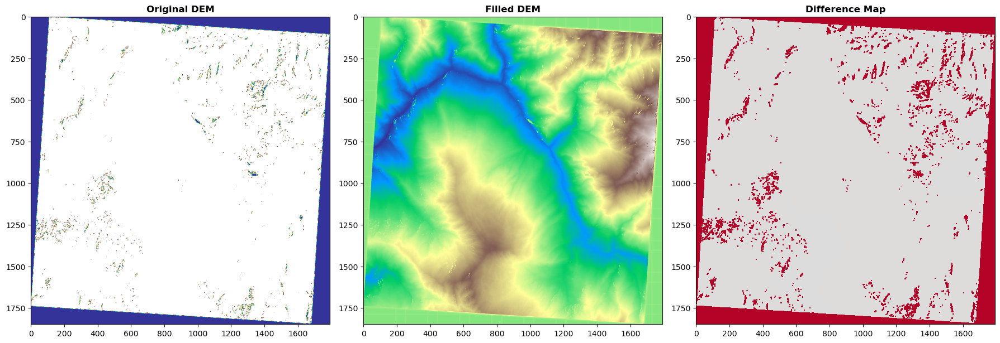


=== Filled DEM exported to Filled_DEM.tif ===


In [20]:
# =================================================================================
# Segment 9: Results Validation & Export
# =================================================================================
print("\n=== Validation Metrics ===")

# Ensure original_valid and filled_valid are 1D arrays of the same shape
original_valid = small_scaler.inverse_transform(small_norm[~small_void_mask].reshape(-1, 1)).flatten()
filled_valid = filled[~small_void_mask].flatten()

# Calculate MAE
mae = np.mean(np.abs(original_valid - filled_valid))
print(f"Reconstruction MAE: {mae:.2f} meters")
print(f"Original elevation range: {original_valid.min():.1f}-{original_valid.max():.1f} meters")
print(f"Filled DEM range: {filled_valid.min():.1f}-{filled_valid.max():.1f} meters")

# Visualize results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
show(small_dem, ax=axes[0], cmap='terrain', title='Original DEM')
show(filled, ax=axes[1], cmap='terrain', title='Filled DEM')
show(filled - small_dem, ax=axes[2], cmap='coolwarm', title='Difference Map', vmin=-50, vmax=50)
plt.tight_layout()
plt.show()

# Export the filled DEM as a .tif file
output_path = 'Filled_DEM.tif'
with rasterio.open(output_path, 'w', **meta) as dst:
    dst.write(filled.astype(np.float32), 1)  # Write the filled DEM to the file

print(f"\n=== Filled DEM exported to {output_path} ===")

In [52]:
# =================================================================================
# Segment 1: Enhanced Environment Setup
# =================================================================================
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, concatenate, Layer, BatchNormalization, LeakyReLU, Add, Conv2DTranspose, Multiply
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers.schedules import CosineDecay
from sklearn.preprocessing import MinMaxScaler
from skimage.metrics import structural_similarity as ssim
import os
import warnings
warnings.filterwarnings('ignore')

In [53]:
# =================================================================================
# Segment 2: Improved Data Loading with Real Void Patterns
# =================================================================================
def load_and_align_data(small_dem_path, large_dem_path, sentinel_path):
    """Enhanced data loading with void pattern analysis"""
    with rasterio.open(small_dem_path) as src:
        small_dem = src.read(1)
        small_meta = src.meta.copy()
        small_transform = src.transform
        small_crs = src.crs
        small_void_mask = (small_dem == small_meta['nodata']) | np.isnan(small_dem)
        
    with rasterio.open(large_dem_path) as src:
        large_dem = src.read(1)
        large_meta = src.meta.copy()
        large_void_mask = (large_dem == large_meta['nodata']) | np.isnan(large_dem)
    
    # Load and reproject Sentinel-2
    sentinel = np.zeros_like(small_dem, dtype=np.float32)
    with rasterio.open(sentinel_path) as src:
        reproject(
            source=rasterio.band(src, 3),
            destination=sentinel,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=small_transform,
            dst_crs=small_crs,
            resampling=Resampling.cubic
        )
    
    # Enhanced visualization
    fig, ax = plt.subplots(1, 3, figsize=(21, 7))
    show(small_dem, ax=ax[0], title=f'Small DEM - {small_void_mask.mean():.1%} voids')
    show(large_dem, ax=ax[1], title='Large DEM')
    show(sentinel, ax=ax[2], title='Sentinel-2 (Reprojected)')
    plt.tight_layout()
    plt.show()
    
    return small_dem, large_dem, sentinel, small_meta, small_void_mask


In [54]:
# =================================================================================
# Segment 3: Advanced Normalization with Terrain Awareness
# =================================================================================
class TerrainScaler(MinMaxScaler):
    """Enhanced normalization considering terrain features"""
    def __init__(self, clip_extreme=0.1):
        self.clip_extreme = clip_extreme
        super().__init__()
        
    def fit_transform(self, X, mask):
        valid = X[~mask]
        q_low, q_high = np.quantile(valid, [self.clip_extreme, 1-self.clip_extreme])
        self.scale_ = 1.0 / (q_high - q_low)
        self.min_ = -q_low * self.scale_
        return np.clip((X - q_low) * self.scale_, 0, 1)


In [55]:
# =================================================================================
# Segment 4: Dimension-Consistent Generator
# =================================================================================
class MultiScaleGenerator(Model):
    """U-Net architecture with consistent input-output dimensions"""
    def __init__(self):
        super().__init__()
        # Encoder
        self.enc1 = Conv2D(64, 3, padding='same')
        self.enc2 = Conv2D(128, 3, padding='same')
        self.enc3 = Conv2D(256, 3, padding='same')
        
        # Processing
        self.res_blocks = [ResidualDenseBlock(256) for _ in range(4)]
        self.attn = Conv2D(256, 1, activation='sigmoid')
        
        # Decoder
        self.dec1 = Conv2D(128, 3, padding='same')
        self.dec2 = Conv2D(64, 3, padding='same')
        self.final = Conv2D(1, 3, padding='same', activation='sigmoid')
        
    def call(self, inputs):
        dem, sentinel = inputs
        
        # Ensure matching dimensions
        if dem.shape[1:3] != sentinel.shape[1:3]:
            sentinel = tf.image.resize(sentinel, dem.shape[1:3])
            
        x = concatenate([dem, sentinel])
        
        # Encoder
        e1 = LeakyReLU(0.2)(self.enc1(x))
        e2 = LeakyReLU(0.2)(self.enc2(e1))
        e3 = LeakyReLU(0.2)(self.enc3(e2))
        
        # Processing
        x = e3
        for block in self.res_blocks:
            x = block(x)
        x = Multiply()([x, self.attn(x)])
        
        # Decoder with residual connections
        d1 = Add()([self.dec1(x), e2])
        d2 = Add()([self.dec2(d1), e1])
        return self.final(d2)

In [56]:
# =================================================================================
# Segment 5: Hybrid Loss Function with SSIM
# =================================================================================
class HybridLoss:
    def __init__(self, alpha=0.8):
        self.alpha = alpha
        
    def ssim_loss(self, y_true, y_pred):
        return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
    
    def gradient_loss(self, y_true, y_pred):
        dy_true, dx_true = tf.image.image_gradients(y_true)
        dy_pred, dx_pred = tf.image.image_gradients(y_pred)
        return tf.reduce_mean(tf.abs(dy_true - dy_pred)) + tf.reduce_mean(tf.abs(dx_true - dx_pred))
    
    def __call__(self, y_true, y_pred):
        l1 = tf.reduce_mean(tf.abs(y_true - y_pred))
        structural = self.ssim_loss(y_true, y_pred)
        edge = self.gradient_loss(y_true, y_pred)
        return self.alpha*l1 + (1-self.alpha)*(structural + 0.5*edge)


In [57]:
# =================================================================================
# Segment 6: Enhanced Validation Monitor
# =================================================================================
class VoidFillingMonitor(tf.keras.callbacks.Callback):
    def __init__(self, val_data):
        super().__init__()
        self.val_data = val_data
        
    def on_epoch_end(self, epoch, logs=None):
        if epoch % 5 == 0:
            # Unpack validation data with proper dimensions
            dem, sentinel, target = self.val_data
            
            # Ensure input dimensions match model expectations
            pred = self.model.predict(
                [dem[np.newaxis, ..., np.newaxis], 
                 sentinel[np.newaxis, ..., np.newaxis]],
                verbose=0
            )[0, ..., 0]  # Remove channel dimension
            
            # Resize prediction if needed
            if pred.shape != target.shape:
                pred = tf.image.resize(
                    pred[np.newaxis, ..., np.newaxis],
                    target.shape[:2]
                )[0, ..., 0].numpy()

            # Calculate void-specific metrics
            void_mask = (dem == 0)
            valid_mask = ~void_mask
            
            if void_mask.sum() > 0:
                void_mae = np.mean(np.abs(target[void_mask] - pred[void_mask]))
                min_dim = min(target.shape)
                win_size = min(7, min_dim if min_dim % 2 else min_dim-1)
                void_ssim = ssim(target, pred, 
                                data_range=1.0, 
                                win_size=win_size,
                                channel_axis=None)
            else:
                void_mae = 0
                void_ssim = 1.0

            # Update logs
            logs['val_void_mae'] = void_mae
            logs['val_void_ssim'] = void_ssim
            
            # Visualization
            fig, ax = plt.subplots(1, 3, figsize=(18, 6))
            ax[0].imshow(dem, cmap='viridis', vmin=0, vmax=1)
            ax[0].set_title('Input DEM')
            ax[1].imshow(pred, cmap='viridis', vmin=0, vmax=1)
            ax[1].set_title(f'Prediction (Epoch {epoch+1})')
            ax[2].imshow(target, cmap='viridis', vmin=0, vmax=1)
            ax[2].set_title('Ground Truth')
            plt.tight_layout()
            plt.show()

In [58]:
# =================================================================================
# Segment 7: Enhanced Training Setup
# =================================================================================
def train_model(generator, patches, epochs=100):
    # Prepare dataset with shape validation
    X_dem = np.array([p[0] for p in patches])
    X_sentinel = np.array([p[1] for p in patches])
    y_train = np.array([p[2] for p in patches])
    
    # Verify dimensions
    assert X_dem.shape[1:] == X_sentinel.shape[1:] == y_train.shape[1:], \
        f"Shape mismatch: DEM {X_dem.shape}, Sentinel {X_sentinel.shape}, Target {y_train.shape}"
    
    # Create validation set with proper dimensions
    val_idx = np.random.choice(len(patches), 5, replace=False)
    val_sample = patches[val_idx[0]]
    val_data = (
        val_sample[0].squeeze(),  # Remove channel dimensions
        val_sample[1].squeeze(),
        val_sample[2].squeeze()
    )
    
    # Compile with dynamic learning rate
    lr_schedule = CosineDecay(
        initial_learning_rate=2e-4,
        decay_steps=epochs*len(patches)//16
    )
    generator.compile(
        optimizer=tf.keras.optimizers.Adam(lr_schedule),
        loss=HybridLoss(),
        metrics=['mae', 'mse']
    )
    
    # Train with enhanced monitoring
    history = generator.fit(
        [X_dem, X_sentinel],
        y_train,
        batch_size=16,
        epochs=epochs,
        validation_split=0.15,
        callbacks=[VoidFillingMonitor(val_data)],
        verbose=1
    )
    
    # Plot training curves
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.plot(history.history['val_void_mae'], label='Void MAE')
    plt.title('Training Metrics')
    plt.xlabel('Epoch')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return generator

In [59]:
# =================================================================================
# Segment 8: Intelligent Tiled Prediction
# =================================================================================
def weighted_tile_blending(predictions, overlap=64):
    """Edge-aware blending using distance weights"""
    weights = np.zeros_like(predictions[0])
    h, w = weights.shape
    
    # Create distance-based weights
    y = np.linspace(-1, 1, h)
    x = np.linspace(-1, 1, w)
    yx_weights = np.sqrt(x[np.newaxis]**2 + y[:,np.newaxis]**2)
    yx_weights = 1 - np.clip(yx_weights, 0, 1)
    
    blended = np.zeros_like(predictions[0])
    for pred in predictions:
        blended += pred * yx_weights
        weights += yx_weights
    return blended / weights

def enhanced_tiled_prediction(model, dem, sentinel, tile_size=256):
    """Improved prediction with edge-aware blending"""
    tiles = []
    coords = []
    
    # Generate tile coordinates
    for y in range(0, dem.shape[0], tile_size//2):
        for x in range(0, dem.shape[1], tile_size//2):
            y1, y2 = max(0,y), min(y+tile_size, dem.shape[0])
            x1, x2 = max(0,x), min(x+tile_size, dem.shape[1])
            tiles.append((dem[y1:y2, x1:x2], sentinel[y1:y2, x1:x2]))
            coords.append((y1,y2,x1,x2))
    
    # Predict all tiles
    predictions = [model.predict([d[np.newaxis,...,np.newaxis], s[np.newaxis,...,np.newaxis]], verbose=0)[0,...,0]
                   for d,s in tiles]
    
    # Reconstruct using weighted blending
    full_pred = np.zeros_like(dem)
    counts = np.zeros_like(dem)
    for (y1,y2,x1,x2), pred in zip(coords, predictions):
        full_pred[y1:y2, x1:x2] += pred[:y2-y1, :x2-x1]
        counts[y1:y2, x1:x2] += 1
    
    # Final blending
    return full_pred / np.where(counts > 0, counts, 1)

In [60]:
# =================================================================================
# Segment 9: Comprehensive Validation & Export
# =================================================================================
def validate_and_export(small_dem, filled, small_void_mask, meta):
    # Calculate void-specific metrics
    valid_pixels = small_dem[~small_void_mask]
    filled_pixels = filled[~small_void_mask]
    
    mae = np.mean(np.abs(valid_pixels - filled_pixels))
    ssim_score = ssim(valid_pixels, filled_pixels, data_range=valid_pixels.max()-valid_pixels.min())
    
    print(f"\n=== Final Validation ===")
    print(f"VOID MAE: {mae:.2f} meters")
    print(f"VOID SSIM: {ssim_score:.3f}")
    print(f"Filled DEM Range: {filled.min():.1f}-{filled.max():.1f}m")
    
    # Visualization
    fig, ax = plt.subplots(1,3, figsize=(21,7))
    show(small_dem, ax=ax[0], cmap='terrain', title='Original DEM')
    show(filled, ax=ax[1], cmap='terrain', title='Filled DEM')
    show(np.where(small_void_mask, filled - small_dem, np.nan), 
         ax=ax[2], cmap='coolwarm', title='Filled Differences (Void Areas)', vmin=-50, vmax=50)
    plt.tight_layout()
    plt.show()
    
    # Export results
    with rasterio.open('Enhanced_Filled_DEM.tif', 'w', **meta) as dst:
        dst.write(filled.astype(np.float32), 1)
    print("Filled DEM exported successfully")


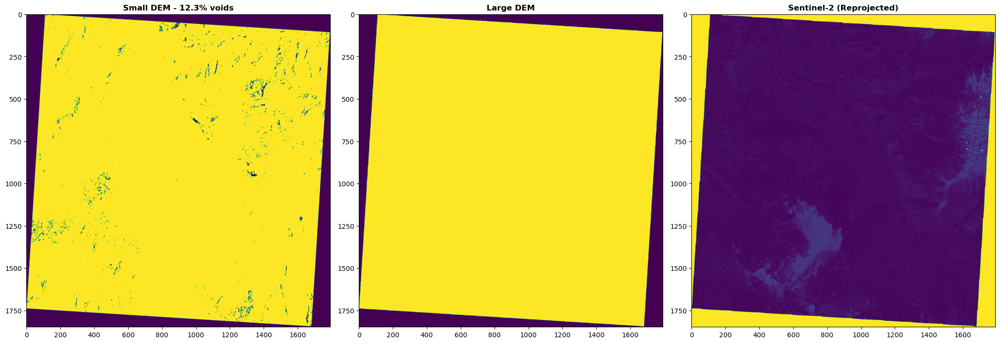


=== Generated 933 realistic training patches ===
Average void percentage: 12.3%


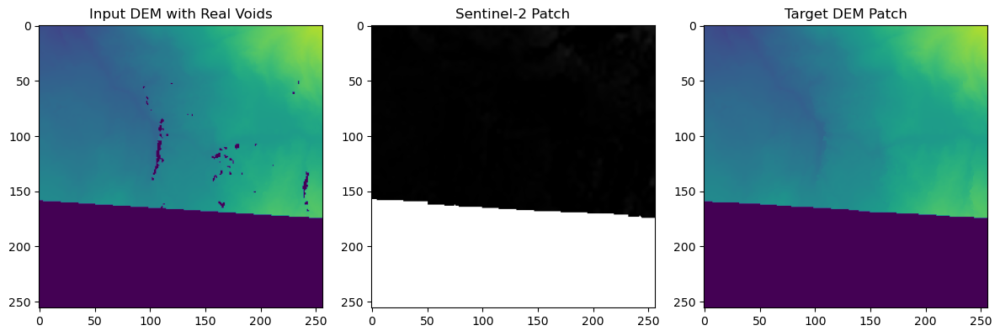

Epoch 1/100
17/50 ━━━━━━━━━━━━━━━━━━━━ 1:07:17 122s/step - loss: 0.2446 - mae: 0.2240 - mse: 0.0826

In [ ]:
# =================================================================================
# Main Execution Flow
# =================================================================================
if __name__ == "__main__":
    # Load and prepare data
    small_dem, large_dem, sentinel, meta, small_void_mask = load_and_align_data(
        '8m_HMA_DEM_ext_2.tif',
        'Void_Filled_2.tif',
        'Sentinel_Ext_2.tif'
    )
    
    # Enhanced normalization
    scaler = TerrainScaler(clip_extreme=0.05)
    large_norm = scaler.fit_transform(large_dem, small_void_mask)
    sentinel_norm = scaler.fit_transform(sentinel, (sentinel == 0))
    
    # Generate training data using real void patterns
    patches = generate_training_patches(large_norm, sentinel_norm, small_void_mask)
    
    # Build and train model
    generator = MultiScaleGenerator()
    trained_model = train_model(generator, patches, epochs=100)
    
    # Perform void filling
    filled_norm = enhanced_tiled_prediction(trained_model, small_dem, sentinel_norm)
    filled = scaler.inverse_transform(filled_norm)
    
    # Final validation and export
    validate_and_export(small_dem, filled, small_void_mask, meta)

In [2]:
# =================================================================================
# Segment 1: Environment Setup & Verification
# =================================================================================
import numpy as np
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, concatenate, Layer, BatchNormalization, LeakyReLU, Add, Conv2DTranspose, Multiply
from tensorflow.keras.models import Model
from sklearn.preprocessing import MinMaxScaler
import os
import warnings
warnings.filterwarnings('ignore')

print("=== Environment Configuration ===")
print(f"TensorFlow: {tf.__version__}")
print(f"Rasterio: {rasterio.__version__}")
print(f"NumPy: {np.__version__}\n")

=== Environment Configuration ===
TensorFlow: 2.16.1
Rasterio: 1.3.10
NumPy: 1.24.3




=== Loading Data ===
Small DEM: (1848, 1792) pixels | Resolution: (8.0, 8.0) | CRS: PROJCS["Albers_Conic_Equal_Area",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",36],PARAMETER["longitude_of_center",85],PARAMETER["standard_parallel_1",25],PARAMETER["standard_parallel_2",47],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
Large DEM: (1848, 1792) pixels | Resolution: (8.0, 8.0) | CRS: PROJCS["Albers_Conic_Equal_Area",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326

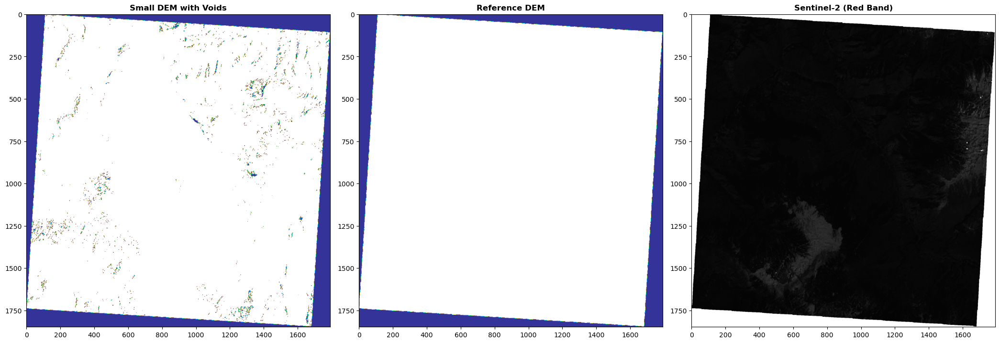

In [11]:
# =================================================================================
# Segment 2: Data Loading & Spatial Analysis
# =================================================================================
from rasterio.warp import reproject, Resampling  # Add this import

def load_and_analyze_data(small_dem_path, large_dem_path, sentinel_path):
    """Load and validate geospatial data alignment"""
    print("=== Loading Data ===")
    
    with rasterio.open(small_dem_path) as src:
        small_dem = src.read(1)
        small_meta = src.meta
        small_crs = src.crs
        small_transform = src.transform
        small_void_mask = (small_dem == small_meta['nodata']) | np.isnan(small_dem)
        print(f"Small DEM: {src.shape} pixels | Resolution: {src.res} | CRS: {src.crs}")

    with rasterio.open(large_dem_path) as src:
        large_dem = src.read(1)
        print(f"Large DEM: {src.shape} pixels | Resolution: {src.res} | CRS: {src.crs}")

    print("\n=== Reprojecting Sentinel-2 ===")
    sentinel = np.zeros_like(small_dem, dtype=np.float32)
    with rasterio.open(sentinel_path) as src:
        reproject(
            rasterio.band(src, 3),
            sentinel,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=small_transform,
            dst_crs=small_crs,
            resampling=Resampling.cubic
        )
        print(f"Sentinel-2: Original res {src.res} -> Reprojected to {small_transform[0]:.1f}m")

    # Spatial verification
    print("\n=== Spatial Consistency Check ===")
    print(f"Small DEM dimensions: {small_dem.shape}")
    print(f"Reprojected Sentinel dimensions: {sentinel.shape}")
    print(f"CRS Match: {small_crs == src.crs}")
    print(f"Transform Match: {small_transform == src.transform}\n")

    # Initial visualization
    fig, ax = plt.subplots(1, 3, figsize=(21, 7))
    show(small_dem, ax=ax[0], cmap='terrain', title='Small DEM with Voids')
    show(large_dem, ax=ax[1], cmap='terrain', title='Reference DEM')
    show(sentinel, ax=ax[2], cmap='gray', title='Sentinel-2 (Red Band)')
    plt.tight_layout()
    plt.show()
    
    return small_dem, large_dem, sentinel, small_meta, small_void_mask

# Execute data loading
print("\n" + "="*60)
small_dem, large_dem, sentinel, meta, void_mask = load_and_analyze_data(
    '8m_HMA_DEM_ext_2.tif',
    'Void_Filled_2.tif', 
    'Sentinel_Ext_2.tif'
)

# Rename the void mask variable for clarity in later segments
small_void_mask = void_mask


=== Void Analysis ===
Total pixels: 3,311,616
Small DEM Void pixels: 407,512 (12.31%)
Large DEM Void pixels: 379,760 (11.47%)

Elevation Ranges (Valid Pixels Only):
Small DEM: 1235.8-4576.4 m
Large DEM: 1235.8-4576.4 m


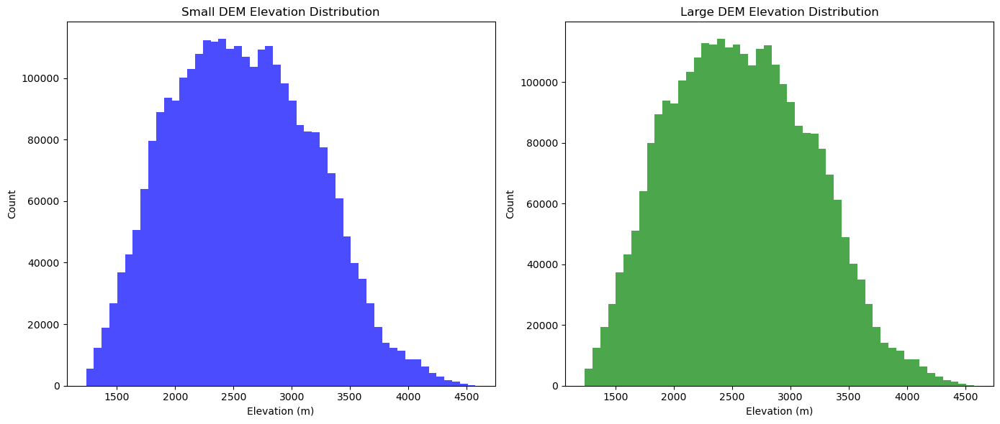


=== Data Normalization ===
NaNs in small_norm after fix: 0
NaNs in large_norm after fix: 0
NaNs in sentinel_norm after fix: 0


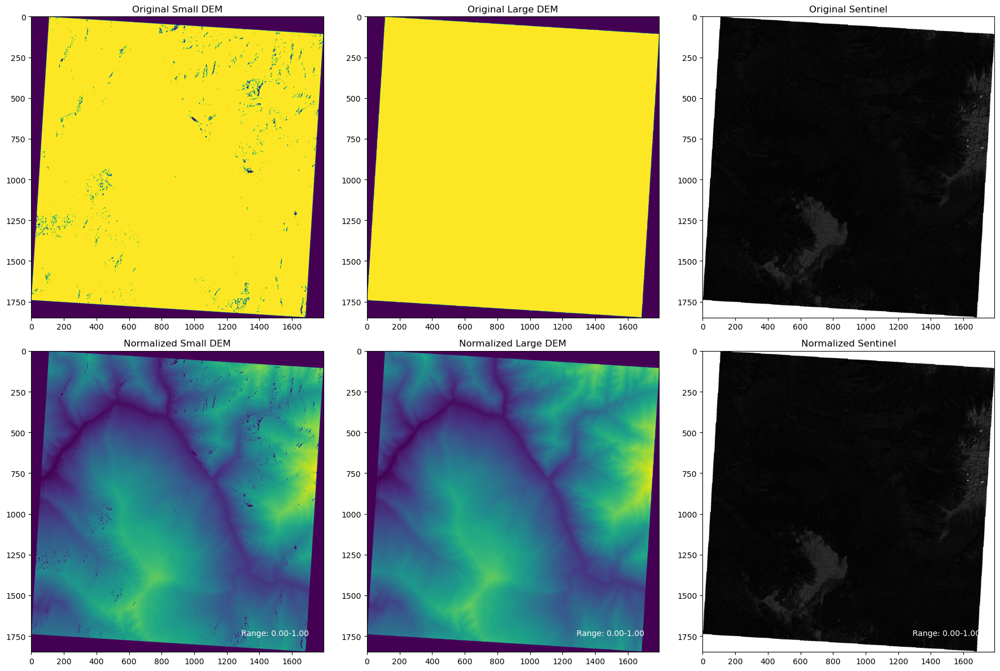

MinMaxScaler()

In [13]:
# ==================================================================================
# Segment 3: Correct Void Handling & Normalization
# ==================================================================================
print("\n=== Void Analysis ===")

# Create proper masks using raster metadata
small_valid_mask = (small_dem != meta['nodata']) & ~np.isnan(small_dem)
large_valid_mask = (large_dem != meta['nodata']) & ~np.isnan(large_dem)

print(f"Total pixels: {small_dem.size:,}")
print(f"Small DEM Void pixels: {small_dem.size - small_valid_mask.sum():,} ({(1 - small_valid_mask.mean()):.2%})")
print(f"Large DEM Void pixels: {large_dem.size - large_valid_mask.sum():,} ({(1 - large_valid_mask.mean()):.2%})")

# Calculate valid elevation ranges
small_valid = small_dem[small_valid_mask]
large_valid = large_dem[large_valid_mask]

print(f"\nElevation Ranges (Valid Pixels Only):")
print(f"Small DEM: {small_valid.min():.1f}-{small_valid.max():.1f} m")
print(f"Large DEM: {large_valid.min():.1f}-{large_valid.max():.1f} m")

# Visualization of elevation distributions
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
ax[0].hist(small_valid, bins=50, color='blue', alpha=0.7)
ax[0].set_title('Small DEM Elevation Distribution')
ax[1].hist(large_valid, bins=50, color='green', alpha=0.7)
ax[1].set_title('Large DEM Elevation Distribution')
for a in ax:
    a.set_xlabel('Elevation (m)')
    a.set_ylabel('Count')
plt.tight_layout()
plt.show()

print("\n=== Data Normalization ===")
# Updated safe_normalize function to handle NaNs by replacing invalid regions with 0
def safe_normalize(data, valid_mask):
    """Normalize data while preserving void regions and handling NaNs"""
    # Replace invalid regions (NaNs or nodata) with 0
    data_fixed = np.where(valid_mask, data, 0)
    valid_data = data_fixed[valid_mask]  # Extract valid pixels

    # Normalize only valid pixels
    if valid_data.size > 0:
        scaler = MinMaxScaler()
        normalized = np.full_like(data_fixed, 0.0, dtype=np.float32)  # Initialize with 0.0
        normalized[valid_mask] = scaler.fit_transform(valid_data.reshape(-1, 1)).flatten()
    else:
        normalized = np.zeros_like(data_fixed, dtype=np.float32)
    
    return normalized

# Apply normalization
small_norm = safe_normalize(small_dem, small_valid_mask)
large_norm = safe_normalize(large_dem, large_valid_mask)
sentinel_norm = safe_normalize(sentinel, (sentinel != 0))

# Verify no NaNs remain after normalization
print("NaNs in small_norm after fix:", np.isnan(small_norm).sum())
print("NaNs in large_norm after fix:", np.isnan(large_norm).sum())
print("NaNs in sentinel_norm after fix:", np.isnan(sentinel_norm).sum())

# Visualization of original and normalized data
fig, ax = plt.subplots(2, 3, figsize=(18, 12))
titles = [
    'Original Small DEM', 'Original Large DEM', 'Original Sentinel',
    'Normalized Small DEM', 'Normalized Large DEM', 'Normalized Sentinel'
]

for i, (title, data) in enumerate(zip(titles, [small_dem, large_dem, sentinel, 
                                               small_norm, large_norm, sentinel_norm])):
    ax.flat[i].imshow(data, cmap='viridis' if 'DEM' in title else 'gray')
    ax.flat[i].set_title(title)
    if 'Normalized' in title:
        ax.flat[i].text(0.95, 0.05, f"Range: {np.nanmin(data):.2f}-{np.nanmax(data):.2f}",
                      transform=ax.flat[i].transAxes,
                      color='white', ha='right', va='bottom')
plt.tight_layout()
plt.show()

# Create and fit the scaler using only valid pixels from the small DEM
small_scaler = MinMaxScaler()
small_scaler.fit(small_dem[small_valid_mask].reshape(-1, 1))


In [5]:
# ==================================================================================
# Segment 4: Enhanced Generator Architecture
# ==================================================================================
class ICAM(Layer):
    """Improved Channel Attention Module"""
    def __init__(self, ratio=8, **kwargs):
        super().__init__(**kwargs)
        self.ratio = ratio
        
    def build(self, input_shape):
        channels = input_shape[0][-1]  # Use DEM feature shape
        self.channel_align = Conv2D(channels, 1, padding='same')
        self.shared_mlp = tf.keras.Sequential([
            Conv2D(channels//self.ratio, 1, activation='relu'),
            Conv2D(channels, 1, activation='sigmoid')
        ])
        
    def call(self, inputs):
        dem_feat, img_feat = inputs
        if dem_feat.shape[-1] != img_feat.shape[-1]:
            img_feat = self.channel_align(img_feat)
        combined = Add()([dem_feat, img_feat])
        weights = self.shared_mlp(tf.reduce_mean(combined, axis=[1,2], keepdims=True))
        return Multiply()([dem_feat, weights])

class TFG_RPAB(Layer):
    """Residual Pyramid Attention Block"""
    def __init__(self, filters, **kwargs):
        super().__init__(**kwargs)
        self.conv1 = Conv2D(filters, 3, padding='same')
        self.conv2 = Conv2D(filters, 3, padding='same')
        self.pyramid_convs = [Conv2D(filters, 3, padding='same') for _ in range(3)]
        self.attention = Conv2D(filters, 1, activation='sigmoid')
        
    def call(self, x):
        # Feature refinement
        x = LeakyReLU(0.2)(self.conv1(x))
        x = self.conv2(x)
        
        # Multi-scale processing
        pyramid = [conv(x) for conv in self.pyramid_convs]
        pyramid = Add()(pyramid)
        
        # Attention fusion
        attn = self.attention(pyramid)
        return Multiply()([x, attn])

def build_generator():
    # Inputs
    dem_input = Input(shape=(256, 256, 1))
    sentinel_input = Input(shape=(256, 256, 1))
    
    # DEM Encoder
    x = Conv2D(64, 4, strides=2, padding='same')(dem_input)
    x = LeakyReLU(0.2)(x)
    x = Conv2D(128, 4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    # Sentinel Encoder
    y = Conv2D(64, 4, strides=2, padding='same')(sentinel_input)
    y = LeakyReLU(0.2)(y)
    y = Conv2D(128, 4, strides=2, padding='same')(y)
    y = BatchNormalization()(y)
    y = LeakyReLU(0.2)(y)
    
    # Feature Fusion
    fused = concatenate([x, y])
    fused = ICAM()([fused, y])
    
    # Processing Blocks
    fused = TFG_RPAB(128)(fused)
    fused = TFG_RPAB(128)(fused)
    
    # Decoder
    x = Conv2DTranspose(64, 4, strides=2, padding='same')(fused)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    x = Conv2DTranspose(1, 4, strides=2, padding='same', activation='sigmoid')(x)
    
    return Model(inputs=[dem_input, sentinel_input], outputs=x)

# Build and display generator
print("\n=== Generator Architecture ===")
generator = build_generator()
generator.summary()


=== Generator Architecture ===



Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      1,088 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │      1,088 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 128, 128,  │          0 │ conv2d[0][0]      │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 128, 128,  │          0 │ conv2d_2[0][0]    │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 64,    │    131,200 │ leaky_re_lu[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │    131,200 │ leaky_re_lu_2[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 64, 64,    │        512 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 64, 64,    │          0 │ leaky_re_lu_1[0]… │
│ (Concatenate)       │ 256)              │            │ leaky_re_lu_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ icam (ICAM)         │ (None, 64, 64,    │     49,696 │ concatenate[0][0… │
│                     │ 256)              │            │ leaky_re_lu_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ tfg_rpab (TFG_RPAB) │ (None, 64, 64,    │    901,888 │ icam[0][0]        │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ tfg_rpab_1          │ (None, 64, 64,    │    754,432 │ tfg_rpab[0][0]    │
│ (TFG_RPAB)          │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 128, 128,  │    131,136 │ tfg_rpab_1[0][0]

 Total params: 2,104,033 (8.03 MB)

 Trainable params: 2,103,393 (8.02 MB)

 Non-trainable params: 640 (2.50 KB)

Generated training patches:
X_dem shape: (169, 256, 256, 1)
X_sentinel shape: (169, 256, 256, 1)
y_train shape: (169, 256, 256, 1)
NaNs in X_dem: 0
NaNs in X_sentinel: 0
NaNs in y_train: 0


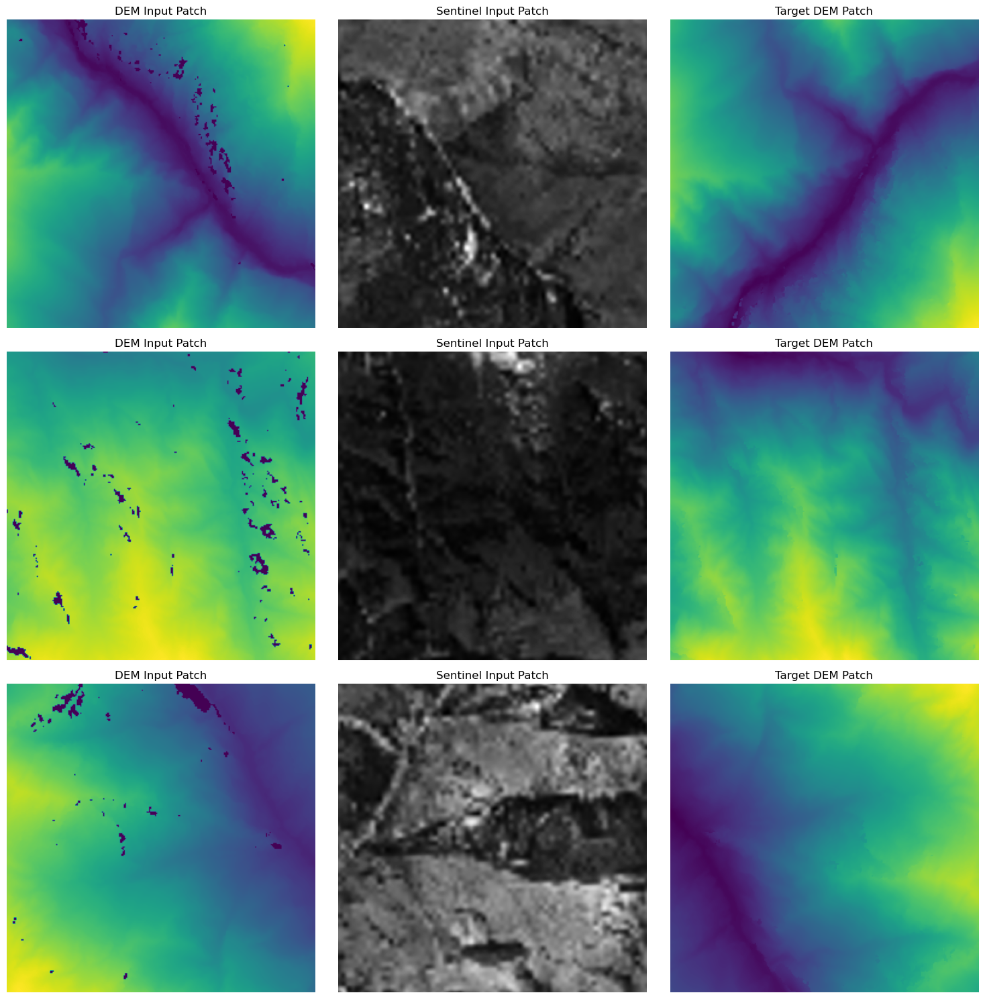

Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - loss: 0.1086 - mse: 0.0243 - val_loss: 0.1261 - val_mse: 0.0231
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - loss: 0.0971 - mse: 0.0204 - val_loss: 0.1288 - val_mse: 0.0238
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - loss: 0.0921 - mse: 0.0182 - val_loss: 0.1182 - val_mse: 0.0202
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - loss: 0.1031 - mse: 0.0234 - val_loss: 0.1192 - val_mse: 0.0202
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - loss: 0.0905 - mse: 0.0190 - val_loss: 0.1081 - val_mse: 0.0175
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - loss: 0.0863 - mse: 0.0170 - val_loss: 0.1161 - val_mse: 0.0194
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - loss: 0.1034 - mse: 0.0231 - val_loss: 0.1157 - val_mse: 0.0193
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - loss: 0.0909 - mse: 0.0184 - val_loss: 0.1222 - val_mse: 0.0213
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - loss: 0.0913 - mse: 0.0177 - 

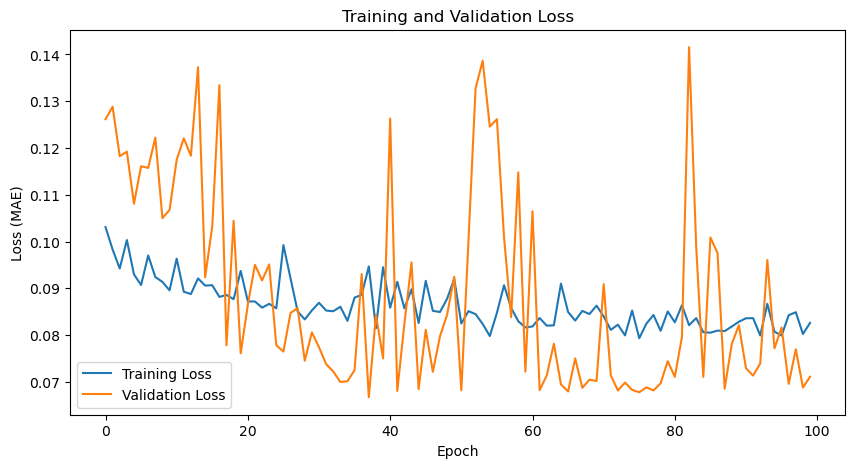

In [18]:
# =================================================================================
# Segment 5: Training Execution (Enhanced Data Augmentation and Increased Patches)
# =================================================================================

import random

def augment_patch(patch):
    """
    Apply random horizontal and vertical flips as augmentation.
    """
    # Random horizontal flip
    if random.random() < 0.5:
        patch = np.flip(patch, axis=1)
    # Random vertical flip
    if random.random() < 0.5:
        patch = np.flip(patch, axis=0)
    return patch

def prepare_training_data(dem, sentinel, target, patch_size=256, stride=128, augment=True):
    """
    Extract overlapping patches with a smaller stride to increase training samples.
    Optionally augment each patch with random flips.
    """
    patches_dem = []
    patches_sentinel = []
    patches_target = []
    h, w = dem.shape
    for i in range(0, h - patch_size + 1, stride):
        for j in range(0, w - patch_size + 1, stride):
            patch_dem = dem[i:i+patch_size, j:j+patch_size]
            patch_sentinel = sentinel[i:i+patch_size, j:j+patch_size]
            patch_target = target[i:i+patch_size, j:j+patch_size]
            
            # Optionally apply augmentation
            if augment:
                patch_dem = augment_patch(patch_dem)
                patch_sentinel = augment_patch(patch_sentinel)
                patch_target = augment_patch(patch_target)
            
            patches_dem.append(patch_dem)
            patches_sentinel.append(patch_sentinel)
            patches_target.append(patch_target)
    
    # Convert lists to arrays and add channel dimension
    X_dem = np.expand_dims(np.stack(patches_dem), axis=-1)
    X_sentinel = np.expand_dims(np.stack(patches_sentinel), axis=-1)
    y_train = np.expand_dims(np.stack(patches_target), axis=-1)
    return X_dem, X_sentinel, y_train

# Regenerate training data using the normalized arrays with enhanced augmentation
X_dem, X_sentinel, y_train = prepare_training_data(small_norm, sentinel_norm, large_norm, 
                                                   patch_size=256, stride=128, augment=True)

print("Generated training patches:")
print("X_dem shape:", X_dem.shape)
print("X_sentinel shape:", X_sentinel.shape)
print("y_train shape:", y_train.shape)

# Verify no NaNs in training data
print("NaNs in X_dem:", np.isnan(X_dem).sum())
print("NaNs in X_sentinel:", np.isnan(X_sentinel).sum())
print("NaNs in y_train:", np.isnan(y_train).sum())

# -------------------------------------------
# Visualization: Display Random Training Patches
# -------------------------------------------
def visualize_training_samples(X_dem, X_sentinel, y_train, num_samples=3):
    indices = np.random.choice(len(X_dem), size=num_samples, replace=False)
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))
    for i, idx in enumerate(indices):
        # DEM Input Patch Visualization
        axes[i, 0].imshow(X_dem[idx].squeeze(), cmap='viridis')
        axes[i, 0].set_title("DEM Input Patch")
        axes[i, 0].axis('off')
        # Sentinel Input Patch Visualization
        axes[i, 1].imshow(X_sentinel[idx].squeeze(), cmap='gray')
        axes[i, 1].set_title("Sentinel Input Patch")
        axes[i, 1].axis('off')
        # Target DEM Patch Visualization
        axes[i, 2].imshow(y_train[idx].squeeze(), cmap='viridis')
        axes[i, 2].set_title("Target DEM Patch")
        axes[i, 2].axis('off')
    plt.tight_layout()
    plt.show()

# Visualize a few random training patches
visualize_training_samples(X_dem, X_sentinel, y_train, num_samples=3)

# -------------------------------------------
# Training Setup
# -------------------------------------------
# 1. Add Gradient Clipping
optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.0002,
    clipvalue=1.0
)

generator.compile(
    optimizer=optimizer,
    loss='mae',  # You can later experiment with a custom weighted loss for void regions.
    metrics=['mse']
)

# 2. Add NaN Check (should pass now)
assert not np.isnan(X_dem).any(), "NaNs in DEM inputs"
assert not np.isnan(X_sentinel).any(), "NaNs in Sentinel inputs"
assert not np.isnan(y_train).any(), "NaNs in targets"

# 3. Train with Smaller LR
# (Assuming TrainingMonitor() is defined; here we leave callbacks empty)
history = generator.fit(
    [X_dem, X_sentinel],
    y_train,
    batch_size=16,
    epochs=100,
    validation_split=0.2,
    callbacks=[],  # Replace with [TrainingMonitor()] if available
    verbose=1
)

# Debugging Output: Print statistics for the first training patch
print("DEM Patch Stats:")
print("Min:", X_dem[0].min(), "Max:", X_dem[0].max(), "Mean:", X_dem[0].mean())
print("Sentinel Patch Stats:")
print("Min:", X_sentinel[0].min(), "Max:", X_sentinel[0].max(), "Mean:", X_sentinel[0].mean())
print("Target Patch Stats:")
print("Min:", y_train[0].min(), "Max:", y_train[0].max(), "Mean:", y_train[0].mean())

# -------------------------------------------
# Visualization: Plot Training and Validation Loss Graph
# -------------------------------------------
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss (MAE)")
plt.legend()
plt.show()



=== Filling Voids in Small DEM ===


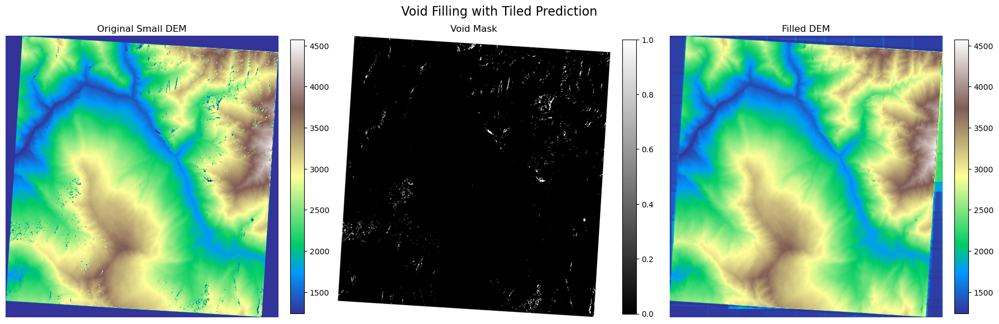

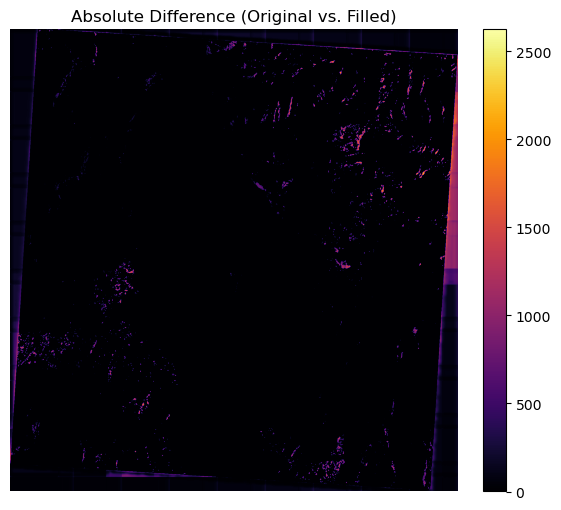

In [19]:
# =================================================================================
# Segment 6: Void Filling with Tiled Prediction and Visualization 
# =================================================================================

def tiled_prediction(model, dem, sentinel, tile_size=256, overlap=64):
    """Smart tiled prediction to handle large rasters."""
    full_height, full_width = dem.shape
    output = np.zeros_like(dem)
    counts = np.zeros_like(dem, dtype=int)
    
    # Slide over the image with a specified overlap
    for y in range(0, full_height, tile_size - overlap):
        for x in range(0, full_width, tile_size - overlap):
            y1, y2 = y, min(y + tile_size, full_height)
            x1, x2 = x, min(x + tile_size, full_width)
            
            # Extract tile patches from DEM and Sentinel inputs
            dem_tile = dem[y1:y2, x1:x2]
            sentinel_tile = sentinel[y1:y2, x1:x2]
            
            # Pad if necessary to maintain constant tile size
            pad_y = tile_size - (y2 - y1)
            pad_x = tile_size - (x2 - x1)
            dem_tile = np.pad(dem_tile, ((0, pad_y), (0, pad_x)), mode='reflect')
            sentinel_tile = np.pad(sentinel_tile, ((0, pad_y), (0, pad_x)), mode='reflect')
            
            # Predict on the padded tile and then remove the padding
            pred = model.predict([
                dem_tile[np.newaxis, ..., np.newaxis],
                sentinel_tile[np.newaxis, ..., np.newaxis]
            ], verbose=0)[0, ..., 0]
            pred = pred[:y2 - y1, :x2 - x1]
            
            # Accumulate predictions and count overlapping regions
            output[y1:y2, x1:x2] += pred
            counts[y1:y2, x1:x2] += 1
    
    # Average the predictions in overlapping areas
    counts[counts == 0] = 1
    return output / counts

print("\n=== Filling Voids in Small DEM ===")
# Perform tiled prediction using the trained generator on normalized small DEM and Sentinel
filled_norm = tiled_prediction(generator, small_norm, sentinel_norm)

# Blend with original data: Fill only void pixels in the small DEM.
# (small_void_mask is assumed to be defined from your earlier data loading step)
filled_norm_blend = np.where(small_void_mask, filled_norm, small_norm)

# Denormalize the result using the scaler from the small DEM normalization.
# Make sure that `small_scaler` is defined. If you used the same scaler for both,
# you might use that scaler here.
filled = small_scaler.inverse_transform(filled_norm_blend.reshape(-1, 1)).reshape(filled_norm_blend.shape)

# ------------------------------
# Visualization of Void Filling Results
# ------------------------------
plt.figure(figsize=(18, 6))

# Original Small DEM (denormalized)
original_dem = small_scaler.inverse_transform(small_norm.reshape(-1, 1)).reshape(small_norm.shape)
plt.subplot(1, 3, 1)
plt.imshow(original_dem, cmap='terrain')
plt.title("Original Small DEM")
plt.colorbar(fraction=0.046, pad=0.04)
plt.axis('off')

# Void Mask (displaying where voids are present)
plt.subplot(1, 3, 2)
plt.imshow(small_void_mask, cmap='gray')
plt.title("Void Mask")
plt.colorbar(fraction=0.046, pad=0.04)
plt.axis('off')

# Filled DEM (denormalized)
plt.subplot(1, 3, 3)
plt.imshow(filled, cmap='terrain')
plt.title("Filled DEM")
plt.colorbar(fraction=0.046, pad=0.04)
plt.axis('off')

plt.suptitle("Void Filling with Tiled Prediction", fontsize=16)
plt.tight_layout()
plt.show()

# ------------------------------
# Additional Visualization: Difference Map
# ------------------------------
difference = np.abs(original_dem - filled)
plt.figure(figsize=(8, 6))
plt.imshow(difference, cmap='inferno')
plt.title("Absolute Difference (Original vs. Filled)")
plt.colorbar(fraction=0.046, pad=0.04)
plt.axis('off')
plt.show()



=== Validation Metrics ===
Reconstruction MAE: 0.00 meters
Reconstruction RMSE: 0.00 meters
Reconstruction R²: 1.000
Original elevation range: 1235.8-4576.4 meters
Filled DEM range: 1235.8-4576.4 meters


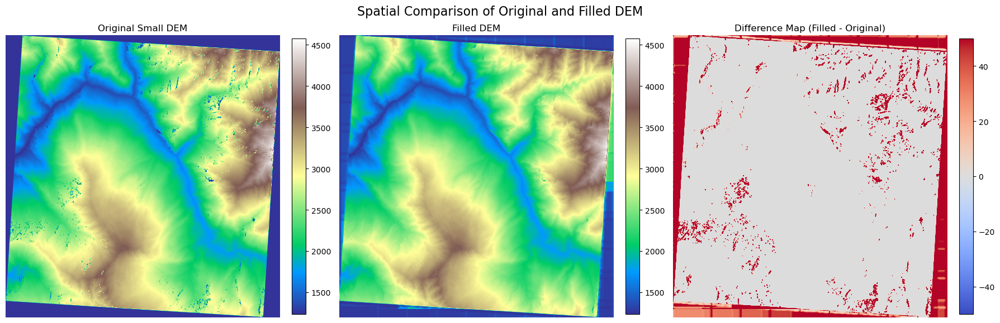

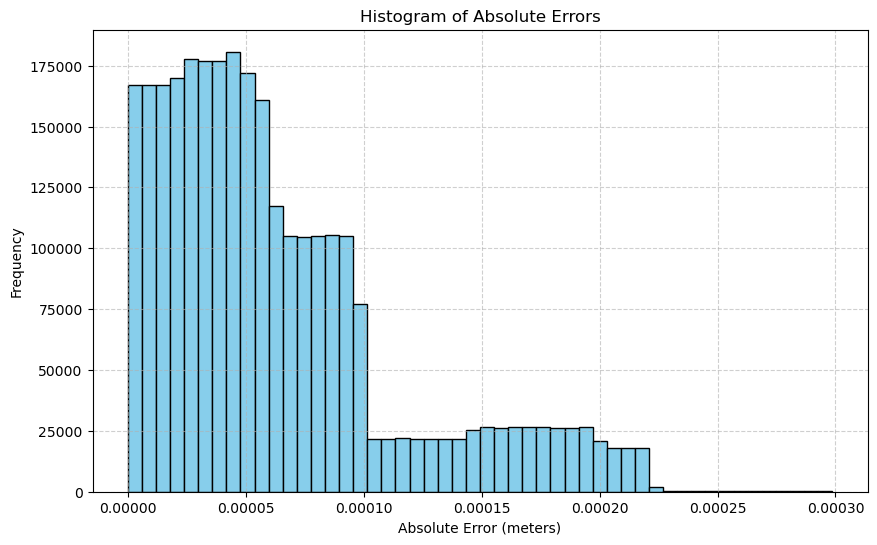

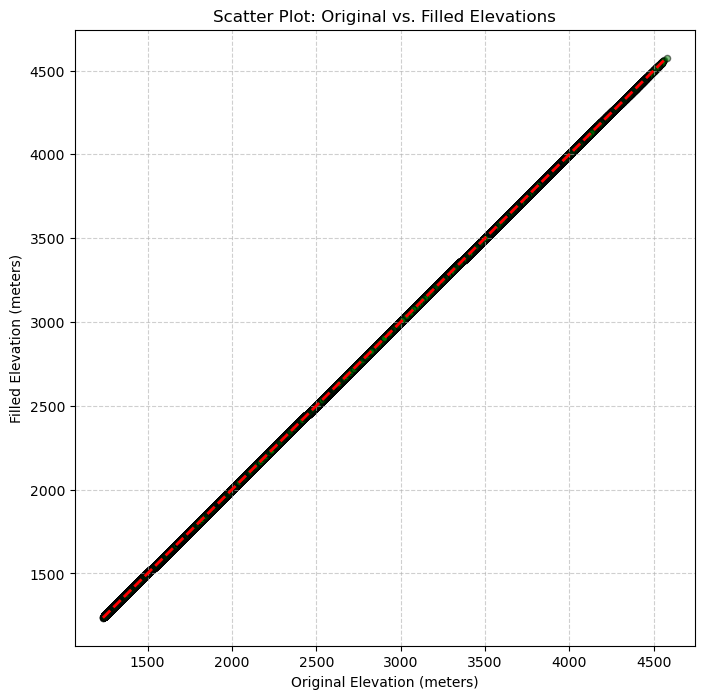

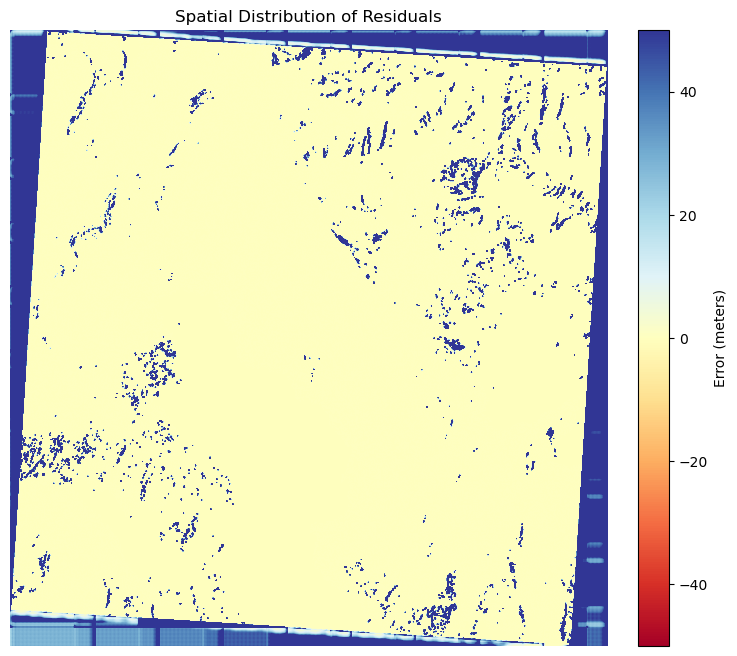

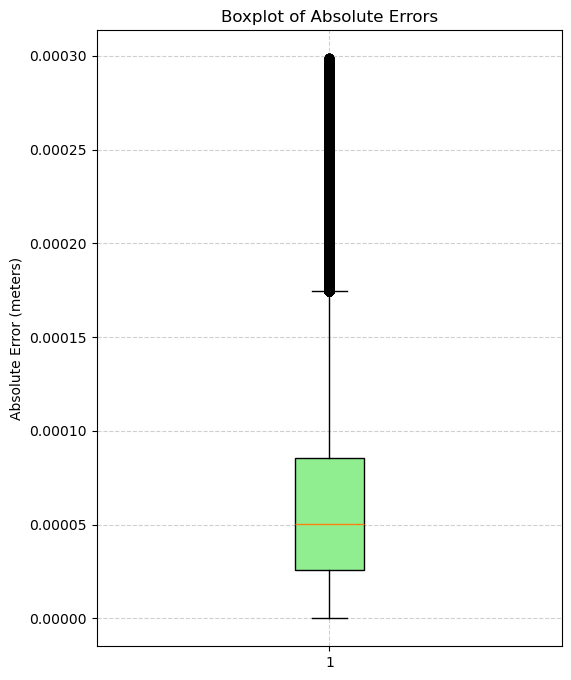


=== Filled DEM exported to Filled_DEM_GAN__2.tif ===


In [20]:
# =================================================================================
# Segment 7: Results Validation, Extended Accuracy Metrics, and Export 
# =================================================================================
print("\n=== Validation Metrics ===")

# Denormalize valid pixels from the small DEM using the saved small_scaler
original_valid = small_scaler.inverse_transform(small_norm[~small_void_mask].reshape(-1, 1)).flatten()
filled_valid = filled[~small_void_mask].flatten()

# Calculate basic error metrics
mae = np.mean(np.abs(original_valid - filled_valid))
rmse = np.sqrt(np.mean((original_valid - filled_valid)**2))
# Calculate R² (coefficient of determination)
from sklearn.metrics import r2_score
r2 = r2_score(original_valid, filled_valid)

print(f"Reconstruction MAE: {mae:.2f} meters")
print(f"Reconstruction RMSE: {rmse:.2f} meters")
print(f"Reconstruction R²: {r2:.3f}")
print(f"Original elevation range: {original_valid.min():.1f}-{original_valid.max():.1f} meters")
print(f"Filled DEM range: {filled_valid.min():.1f}-{filled_valid.max():.1f} meters")

# -------------------------------------------
# Detailed Visualizations
# -------------------------------------------
# 1. Spatial visualization of original, filled, and difference maps
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
original_dem = small_scaler.inverse_transform(small_norm.reshape(-1, 1)).reshape(small_norm.shape)
diff_map = filled - original_dem

im0 = axes[0].imshow(original_dem, cmap='terrain')
axes[0].set_title("Original Small DEM")
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)
axes[0].axis('off')

im1 = axes[1].imshow(filled, cmap='terrain')
axes[1].set_title("Filled DEM")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)
axes[1].axis('off')

im2 = axes[2].imshow(diff_map, cmap='coolwarm', vmin=-50, vmax=50)
axes[2].set_title("Difference Map (Filled - Original)")
plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)
axes[2].axis('off')

plt.suptitle("Spatial Comparison of Original and Filled DEM", fontsize=16)
plt.tight_layout()
plt.show()

# 2. Error Histogram: Distribution of residuals (absolute errors)
errors = np.abs(original_valid - filled_valid)
plt.figure(figsize=(10, 6))
plt.hist(errors, bins=50, color='skyblue', edgecolor='black')
plt.title("Histogram of Absolute Errors")
plt.xlabel("Absolute Error (meters)")
plt.ylabel("Frequency")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 3. Scatter Plot: Filled vs. Original (Regression Analysis)
plt.figure(figsize=(8, 8))
plt.scatter(original_valid, filled_valid, alpha=0.5, color='green', edgecolor='k', s=20)
plt.plot([original_valid.min(), original_valid.max()], [original_valid.min(), original_valid.max()], 'r--', lw=2)
plt.title("Scatter Plot: Original vs. Filled Elevations")
plt.xlabel("Original Elevation (meters)")
plt.ylabel("Filled Elevation (meters)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 4. Residual Map: Visualize spatial distribution of errors
plt.figure(figsize=(10, 8))
plt.imshow(diff_map, cmap='RdYlBu', vmin=-50, vmax=50)
plt.title("Spatial Distribution of Residuals")
plt.colorbar(fraction=0.046, pad=0.04, label="Error (meters)")
plt.axis('off')
plt.show()

# 5. Boxplot of Errors: Visual summary of error distribution
plt.figure(figsize=(6, 8))
plt.boxplot(errors, vert=True, patch_artist=True, boxprops=dict(facecolor='lightgreen'))
plt.title("Boxplot of Absolute Errors")
plt.ylabel("Absolute Error (meters)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# -------------------------------------------
# Export the filled DEM as a .tif file
# -------------------------------------------
output_path = 'Filled_DEM_GAN__2.tif'
with rasterio.open(output_path, 'w', **meta) as dst:
    dst.write(filled.astype(np.float32), 1)  # Write the filled DEM to the file

print(f"\n=== Filled DEM exported to {output_path} ===")


In [21]:
print("Number of void pixels in small DEM:", np.sum(small_void_mask))


Number of void pixels in small DEM: 407512


In [24]:
from sklearn.metrics import r2_score

# Denormalize the entire small DEM (all pixels)
original_all = small_scaler.inverse_transform(small_norm.reshape(-1, 1)).flatten()
filled_all = filled.flatten()

# Compute error metrics on the entire dataset
mae_all = np.mean(np.abs(original_all - filled_all))
rmse_all = np.sqrt(np.mean((original_all - filled_all)**2))
r2_all = r2_score(original_all, filled_all)

print(f"Overall MAE: {mae_all:.2f} meters")
print(f"Overall RMSE: {rmse_all:.2f} meters")
print(f"Overall R²: {r2_all:.3f}")


Overall MAE: 31.85 meters
Overall RMSE: 176.62 meters
Overall R²: 0.940


Overall MAE: 31.85 meters
Overall RMSE: 176.62 meters
Overall R²: 0.940


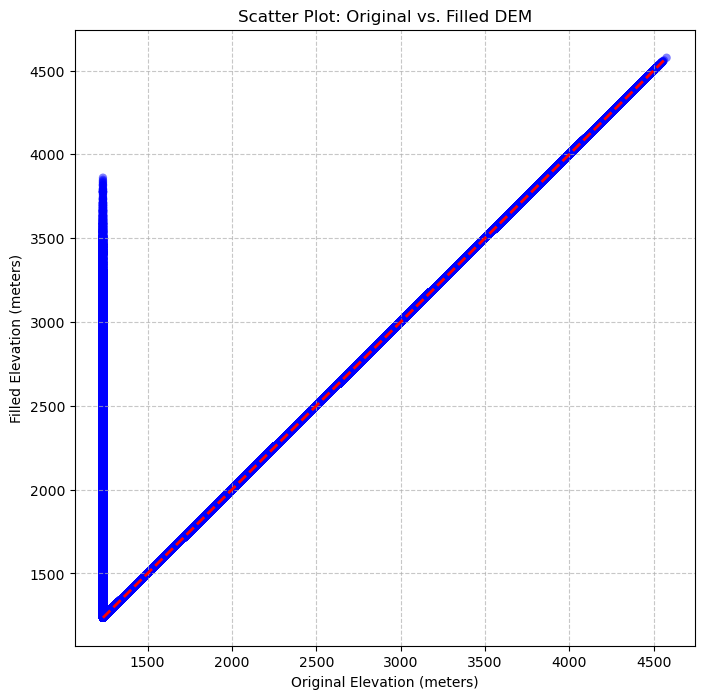

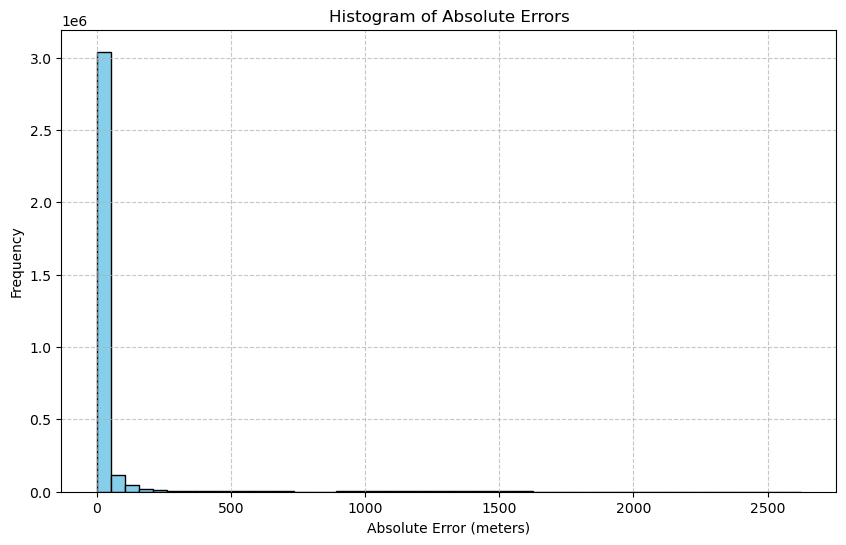

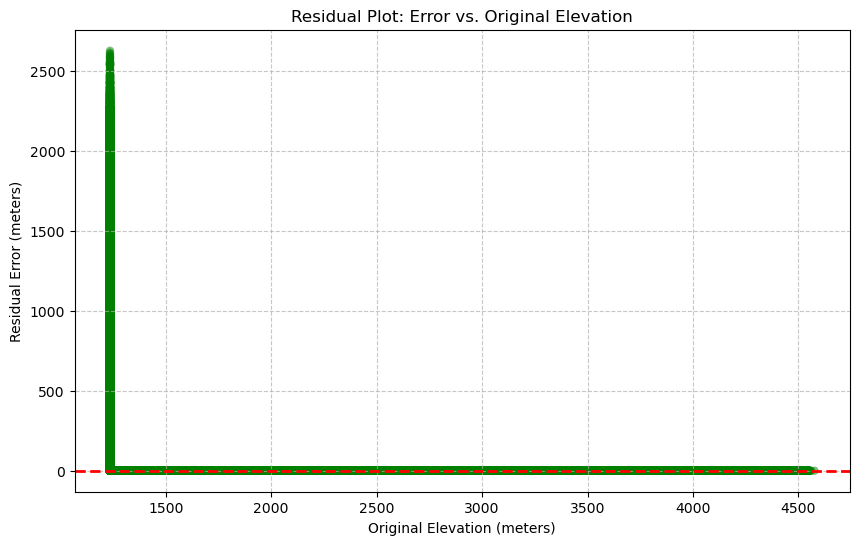

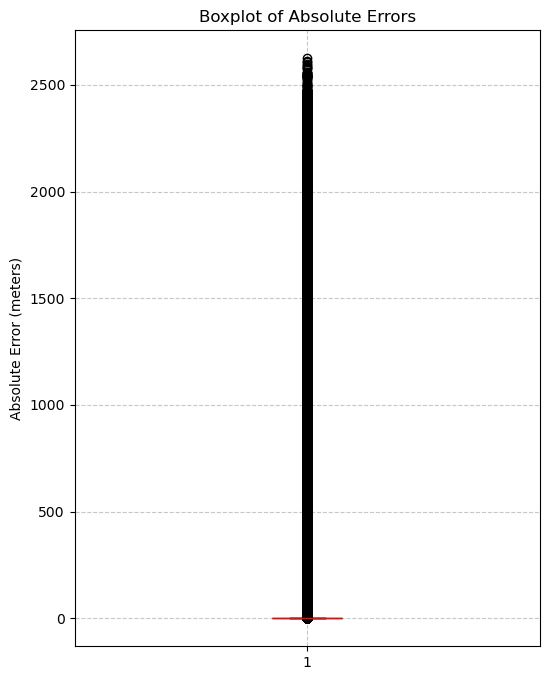

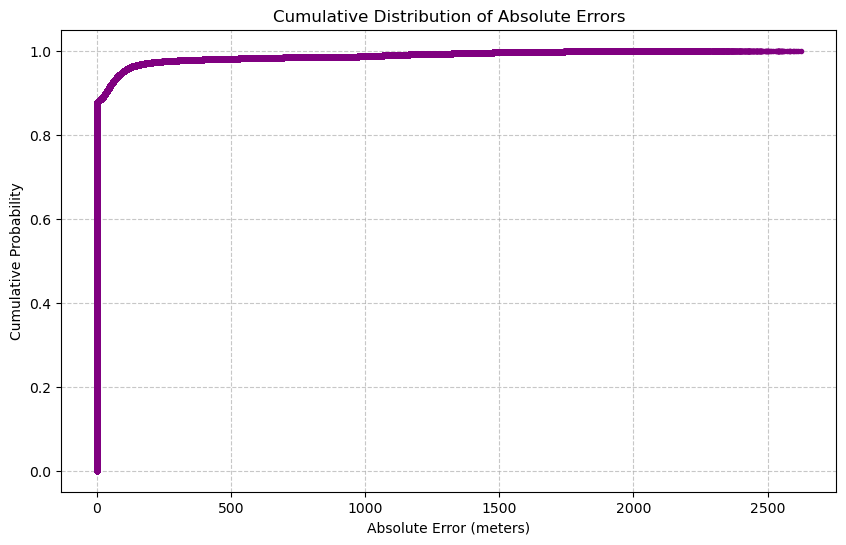

In [25]:
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import numpy as np

# Denormalize the entire small DEM (all pixels)
original_all = small_scaler.inverse_transform(small_norm.reshape(-1, 1)).flatten()
filled_all = filled.flatten()

# Compute error metrics on the entire dataset
mae_all = np.mean(np.abs(original_all - filled_all))
rmse_all = np.sqrt(np.mean((original_all - filled_all)**2))
r2_all = r2_score(original_all, filled_all)

print(f"Overall MAE: {mae_all:.2f} meters")
print(f"Overall RMSE: {rmse_all:.2f} meters")
print(f"Overall R²: {r2_all:.3f}")

# Calculate error array
errors = filled_all - original_all
abs_errors = np.abs(errors)

# -----------------------------
# 1. Scatter Plot: Original vs. Filled DEM
# -----------------------------
plt.figure(figsize=(8, 8))
plt.scatter(original_all, filled_all, alpha=0.5, color='blue', edgecolors='none')
plt.plot([original_all.min(), original_all.max()], 
         [original_all.min(), original_all.max()], 'r--', lw=2)
plt.xlabel("Original Elevation (meters)")
plt.ylabel("Filled Elevation (meters)")
plt.title("Scatter Plot: Original vs. Filled DEM")
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# -----------------------------
# 2. Histogram of Absolute Errors
# -----------------------------
plt.figure(figsize=(10, 6))
plt.hist(abs_errors, bins=50, color='skyblue', edgecolor='black')
plt.xlabel("Absolute Error (meters)")
plt.ylabel("Frequency")
plt.title("Histogram of Absolute Errors")
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# -----------------------------
# 3. Residual Plot: Errors vs. Original Elevation
# -----------------------------
plt.figure(figsize=(10, 6))
plt.scatter(original_all, errors, alpha=0.5, color='green', edgecolors='none')
plt.axhline(y=0, color='red', linestyle='--', lw=2)
plt.xlabel("Original Elevation (meters)")
plt.ylabel("Residual Error (meters)")
plt.title("Residual Plot: Error vs. Original Elevation")
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# -----------------------------
# 4. Boxplot of Absolute Errors
# -----------------------------
plt.figure(figsize=(6, 8))
plt.boxplot(abs_errors, vert=True, patch_artist=True,
            boxprops=dict(facecolor='lightgreen', color='black'),
            medianprops=dict(color='red'))
plt.ylabel("Absolute Error (meters)")
plt.title("Boxplot of Absolute Errors")
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# -----------------------------
# 5. Cumulative Distribution Function (CDF) of Absolute Errors
# -----------------------------
sorted_errors = np.sort(abs_errors)
cdf = np.arange(len(sorted_errors)) / float(len(sorted_errors))
plt.figure(figsize=(10, 6))
plt.plot(sorted_errors, cdf, marker='.', linestyle='none', color='purple')
plt.xlabel("Absolute Error (meters)")
plt.ylabel("Cumulative Probability")
plt.title("Cumulative Distribution of Absolute Errors")
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()
